# Automating Flow Cytometry Data Analysis

**USD M.Sc. Applied Data Science Capstone Project** \
*Shiley-Marcos School of Engineering*


Gabriella Rivera\
John Vincent Deniega \
Date: 23Nov2024


[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/vanguardfox/ADS599/blob/main/ADS599.ipynb)

Mount Google Drive

In [1]:
#from google.colab import drive
#drive.mount('/content/drive')

Install packages:

In [2]:
#!pip install FlowCal
#!pip install flowio
#!pip install openTSNE
#!pip install klib

Import libraries:

In [3]:
import FlowCal
import flowio
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import os
import pandas as pd
import seaborn as sns
from scipy.signal import find_peaks
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import plotly.express as px
import matplotlib.ticker as ticker
import datetime
import klib

from sklearn.preprocessing import StandardScaler
from sklearn.mixture import GaussianMixture

Handle Warnings

In [4]:
import warnings

# Suppress warnings
warnings.filterwarnings('ignore')

Selected cellular surface markers to identify target Dendritic Cells (DC): Myeloid DC and Plasmacytoid DC.

| Marker | Fluorochrome | Description |
|--------|--------------|--------------|
| CD45RA | Ax700 | An isoform of CD45, marking naïve T cells that haven't encountered their antigen
| HLA-DR | BV786 | An MHC class II molecule presenting antigens to CD4+ T cells; indicates antigen-presenting cells (APCs)
| CD3 | APC-H7 | Part of the T-cell receptor complex, essential for T cell activation; found on all T cells
| CD20 | BUV805 | A B cell marker involved in activation and proliferation; used to identify B cells
| CD19 | PE-Cy5 | A co-receptor for B cell activation, primarily expressed on B cells
| CD14 | BV510 | A co-receptor for LPS, marking monocytes and macrophages involved in innate immunity
| CD123 | BB660 | The alpha chain of the IL-3 receptor, found on plasmacytoid dendritic cells and progenitor cells
| CD11c | APC | An integrin marking dendritic cells and certain macrophages, important for cell adhesion and activation

**Cellular Pathway:**

1. *PBMCs (Peripheral Blood Mononuclear Cells)* \
   Starting population

2. *CD3-* \
   Excludes T cells, focusing on B cells and myeloid cells

3. *CD19- & CD20-*  \
   Excludes B cells, narrowing down to monocytes and dendritic cells

4. *CD14-*  \
   Further excludes monocytes, leading to dendritic cell populations

5. *HLA-DR+*  \
   Identifies antigen-presenting cells (APC)

6. *CD11c+ (Myeloid DC)*  \
   Indicates myeloid dendritic cells  \

  **OR**
   
   *CD123+ (Plasmacytoid DC)*   \
   Indicates plasmacytoid dendritic cells


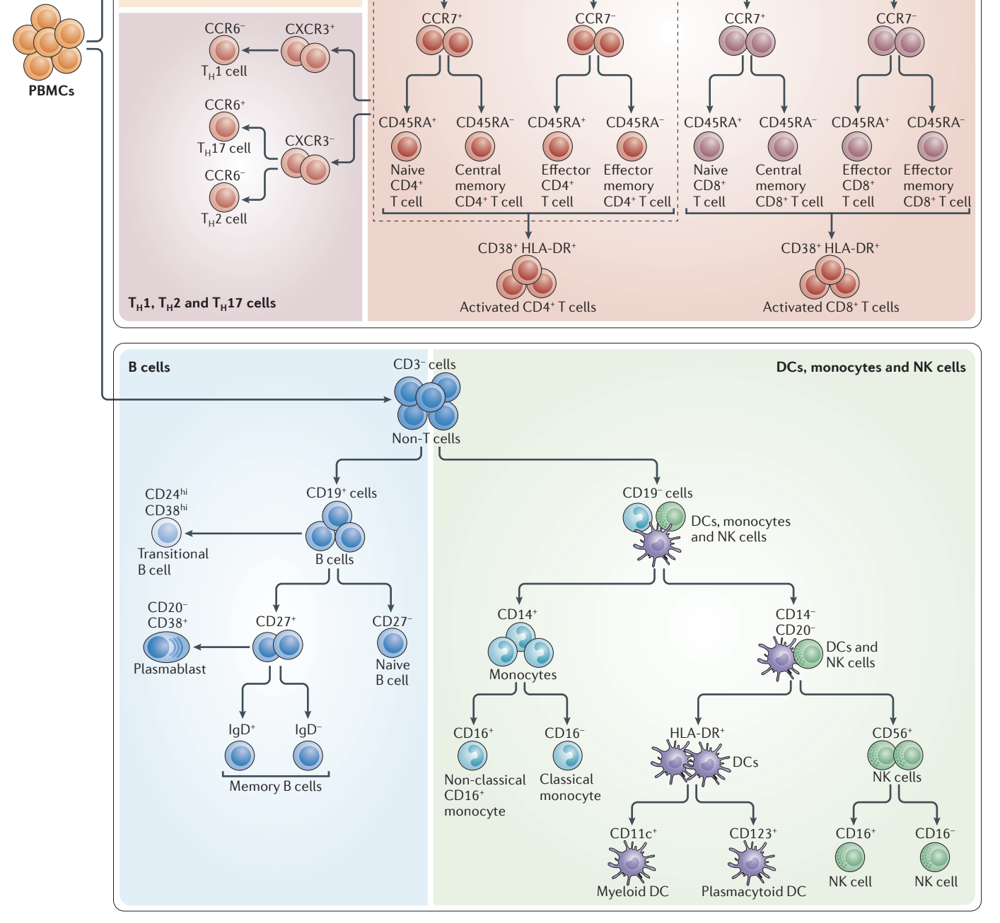

# Flow Cytometry Data Extraction

Import datasets:

In [5]:
# User's MyDrive paths
#JV = "/content/drive/MyDrive/Colab_Notebooks/ADS599"
GR = "/content/drive/MyDrive/DC Marker Files/FCS"

# Only for JV's local execution
# Define the paths dynamically
home_dir = os.path.expanduser("~")
# Change the words after home_dir to reflect your local location/directories for the FCS files
JV = os.path.join(home_dir,
                          "Desktop",
                          "usd_ADS",
                          "ADS599",
                          "Notebook",
                          "FlowRepository_FR-FCM-Z32U_files")

In [6]:
# Define the path to the FCS file
fcs_folder = JV
pbmc_file = "PBMC_090120_1_DCs_A5_A05_031.fcs"
pbmc_path = os.path.join(fcs_folder, pbmc_file)
save_folder = JV

# Load the FCS data into an object
pbmc = FlowCal.io.FCSData(pbmc_path)

# Inspect available attributes
print("Available attributes of FCSData:")
for attr in dir(pbmc):
    if not attr.startswith('_'):
        print(attr)

Available attributes of FCSData:
T
acquisition_end_time
acquisition_start_time
acquisition_time
all
amplification_type
amplifier_gain
analysis
any
argmax
argmin
argpartition
argsort
astype
base
byteswap
channel_labels
channels
choose
clip
compress
conj
conjugate
copy
ctypes
cumprod
cumsum
data
data_type
detector_voltage
diagonal
dot
dtype
dump
dumps
fill
flags
flat
flatten
getfield
hist_bins
imag
infile
item
itemset
itemsize
max
mean
min
nbytes
ndim
newbyteorder
nonzero
partition
prod
ptp
put
range
ravel
real
repeat
reshape
resize
resolution
round
searchsorted
setfield
setflags
shape
size
sort
squeeze
std
strides
sum
swapaxes
take
text
time_step
tobytes
tofile
tolist
tostring
trace
transpose
var
view


In [7]:
# Access the channel labels by calling the method
marker_labels = pbmc.channel_labels()

# Print the marker labels
print("Marker Labels:", marker_labels)

Marker Labels: [None, None, None, 'CADM1 FITC', 'CD141 BB630', 'CD123 BB660', 'FcER1a BB700', None, 'XCR1 BV421', 'CD14 BV510', 'CD16 BV570', None, 'CD172a BV650', None, 'CD303 BV750', 'HLA-DR BV786', 'CD1c BUV395', 'Live Dead UV Blue', None, 'CD56 BUV563', 'CD89 BUV661', 'CD163 BUV737', 'CD20 BUV805', 'CD11c APC', 'CD45RA Ax700', 'CD3 APC-H7', 'CD301 PE', None, 'CD19 PE-Cy5', 'CD5 PE-Cy55', 'CD88 PE-Cy7', None]


In [8]:
%%time

# Convert pbmc to little-endian float32
if pbmc.dtype != '<f4':
    pbmc = np.array(pbmc, dtype='<f4')

# Replace the first three column labels with specified values
marker_labels[0] = "FSC-A"
marker_labels[1] = "FSC-H"
marker_labels[2] = "SSC-A"
marker_labels[31] = "Time"

# Convert the FCS data to a Pandas DataFrame
pbmc_s1_df = pd.DataFrame(pbmc)

# Assign marker labels to the DataFrame columns
pbmc_s1_df.columns = marker_labels

# Extract the 'Time' data and scale it
pbmc_s1_df['Time'] = pbmc_s1_df['Time'] * 0.01

# Convert all columns to float32 (little-endian), except 'Time'
numeric_columns = pbmc_s1_df.columns.difference(['Time'])

# Use astype to convert and force little-endian byte order for numeric columns
pbmc_s1_df[numeric_columns] = pbmc_s1_df[numeric_columns].astype('<f4')

# Save the formatted DataFrame as a CSV file
output_file = "pbmc_s1.csv"

# Uncomment this for Google Colab
save_folder = "/content"

# # Uncomment this for local JV execution
save_folder = os.path.join(home_dir,
                           "Desktop",
                           "usd_ADS",
                           "ADS599",
                           "Notebook",
                           "content")

output_path = os.path.join(save_folder, output_file)
pbmc_s1_df.to_csv(output_path, index=False)

CPU times: user 25 s, sys: 449 ms, total: 25.5 s
Wall time: 25.5 s


In [9]:
# Show PBMC Dataframe
pbmc_s1_df.head()

,FSC-A,FSC-H,SSC-A,CADM1 FITC,CD141 BB630,CD123 BB660,FcER1a BB700,None,XCR1 BV421,CD14 BV510,...,CD20 BUV805,CD11c APC,CD45RA Ax700,CD3 APC-H7,CD301 PE,None,CD19 PE-Cy5,CD5 PE-Cy55,CD88 PE-Cy7,Time
0,87361.875000,79434.132812,598.278687,160.180847,59.948257,265.052338,2209.889160,618.392395,86.726891,135.512466,...,263.738281,134.774185,2193.238281,1619.123413,502.208740,186.362259,161.581375,3681.024658,3134.778076,0.036351
1,126908.382812,108476.132812,1030.258667,202.591660,1682.306030,2094.691162,4600.433594,1695.130615,1039.571655,1021.779724,...,1318.864380,1797.314941,3525.506836,677.857422,5200.446777,3191.416504,642.054871,2521.566406,2330.867432,0.036405
2,80773.437500,72883.585938,460.699219,63.809006,41.512314,187.331284,1758.511597,564.467651,85.910072,132.620850,...,163.514221,136.576172,2556.105469,1337.768311,291.157410,116.808624,78.402611,3396.210205,2594.312744,0.036667
3,98579.289062,90491.320312,798.337646,180.572540,584.399658,4503.693359,10570.937500,4350.170410,1614.768921,780.501343,...,487.675171,2861.196289,4038.256348,650.127197,547.439514,503.161377,774.617554,3809.564453,5784.430176,0.036894
4,81687.250000,74994.593750,586.497864,156.943649,-2.742810,89.636864,1083.409912,343.418365,75.981934,173.593552,...,174.489120,77.228905,3129.699219,1420.843384,196.809097,97.804459,122.227951,2326.320801,2200.183838,0.037151


In [10]:
# Show General Dataframe Information
pbmc_s1_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2088689 entries, 0 to 2088688
Data columns (total 32 columns):
 #   Column             Dtype  
---  ------             -----  
 0   FSC-A              float32
 1   FSC-H              float32
 2   SSC-A              float32
 3   CADM1 FITC         float32
 4   CD141 BB630        float32
 5   CD123 BB660        float32
 6   FcER1a BB700       float32
 7   None               float32
 8   XCR1 BV421         float32
 9   CD14 BV510         float32
 10  CD16 BV570         float32
 11  None               float32
 12  CD172a BV650       float32
 13  None               float32
 14  CD303 BV750        float32
 15  HLA-DR BV786       float32
 16  CD1c BUV395        float32
 17  Live Dead UV Blue  float32
 18  None               float32
 19  CD56 BUV563        float32
 20  CD89 BUV661        float32
 21  CD163 BUV737       float32
 22  CD20 BUV805        float32
 23  CD11c APC          float32
 24  CD45RA Ax700       float32
 25  CD3 APC-H7        

# Data Preprocessing: Domain-Based Filtering

In [11]:
# Uncomment if using Google Colab
# Upload Dataset from Google Drive
#pbmc_s1_df = pd.read_csv("pbmc_s1.csv")

# Uncomment if using local JV instance
pbmc_s1_df = pd.read_csv(os.path.join(save_folder, output_file))

# Round all columns to 3 decimal places
pbmc_s1_df = pbmc_s1_df.round(4)

# Display the shape of the DataFrame
print("Number of Original instances and features:", pbmc_s1_df.shape)

Number of Original instances and features: (2088689, 32)


In [12]:
# Identify if there are any missing values
klib.missingval_plot(pbmc_s1_df)

No missing values found in the dataset.


In [13]:
# Remove unnamed columns
pbmc_s1_df = pbmc_s1_df.loc[:, ~pbmc_s1_df.columns.str.contains('^Unnamed')]

# Display the shape of the DataFrame after filtering
print("Number of instances and features after filtering:", pbmc_s1_df.shape)

Number of instances and features after filtering: (2088689, 27)


In [14]:
# Remove unnecessary features
pbmc_s1_df = pbmc_s1_df.drop(columns=['CADM1 FITC', 'CD141 BB630', 'FcER1a BB700',
                                      'XCR1 BV421', 'CD16 BV570', 'CD172a BV650',
                                      'CD303 BV750', 'CD1c BUV395', 'CD56 BUV563',
                                      'CD89 BUV661', 'CD163 BUV737', 'CD301 PE',
                                      'CD5 PE-Cy55', 'CD88 PE-Cy7'])

# Display the shape of the DataFrame after filtering
print("Number of instances  and features after filtering:", pbmc_s1_df.shape)

Number of instances  and features after filtering: (2088689, 13)


**Add compensation step to correct for spectral overlap between channels.**

In [15]:
# Define folder where your FCS files are stored
fcs_folder = JV # SWITCH: Use JV or GR if user

# List of compensation files
comp_files = [
    "Comp_CD3 APC-H7_F3_F03_022.fcs",
    "Comp_CD11c APC_D3_D03_020.fcs",
    "Comp_CD14 BV510_G1_G01_007.fcs",
    "Comp_CD19 PE-Cy5_A3_A03_017.fcs",
    "Comp_CD20 BUV805_E1_E01_005.fcs",
    "Comp_CD45RA Ax700_E3_E03_021.fcs",
    "Comp_CD123 BB660_F2_F02_014.fcs",
    "Comp_HLA-DR BV786_C2_C02_011.fcs",
    "Comp_Live Dead UV Blue_F4_F04_030.fcs"
]

#Uncomment for JV
# List of compensation files
comp_files = [
    "Comp_CD3_APC-H7_F3_F03_022.fcs", "Comp_CD11c_APC_D3_D03_020.fcs", "Comp_CD14_BV510_G1_G01_007.fcs", "Comp_CD19_PE-Cy5_A3_A03_017.fcs", "Comp_CD20_BUV805_E1_E01_005.fcs", "Comp_CD45RA_Ax700_E3_E03_021.fcs", "Comp_CD123_BB660_F2_F02_014.fcs", "Comp_HLA-DR_BV786_C2_C02_011.fcs", "Comp_Live_Dead_UV_Blue_F4_F04_030.fcs"
]

# Function to load and extract relevant compensation column from FCS files
def load_single_marker_compensation(comp_file):
    comp_path = os.path.join(fcs_folder, comp_file)
    comp_data = FlowCal.io.FCSData(comp_path)

    # Extract the channel labels (markers)
    channel_labels = comp_data.channel_labels()

    # Find the first valid label (the marker label)
    valid_labels = [label for label in channel_labels if label is not None]

    if not valid_labels:
        raise ValueError(f"No valid marker labels found in {comp_file}")

    marker_label = valid_labels[0]

    # Extract the column corresponding to the valid label (compensation values for that marker)
    marker_index = channel_labels.index(marker_label)
    comp_matrix = np.array(comp_data)

    # Create a DataFrame with the marker as the column header
    comp_df = pd.DataFrame(comp_matrix[:, marker_index], columns=[marker_label])

    return comp_df

# Initialize an empty DataFrame for the combined compensation matrix
combined_comp_df = pd.DataFrame()

# Loop through all compensation files and append each one to the combined matrix
for comp_file in comp_files:
    try:
        comp_df = load_single_marker_compensation(comp_file)
        # Append the single marker column to the combined matrix
        combined_comp_df = pd.concat([combined_comp_df, comp_df], axis=1)
    except Exception as e:
        print(f"Error processing {comp_file}: {e}")

# Check the combined compensation matrix
print(f"Combined Compensation Matrix shape: {combined_comp_df.shape}")
print("First few rows of the combined matrix:")
print(combined_comp_df.head())

Combined Compensation Matrix shape: (20000, 9)
First few rows of the combined matrix:
     CD3 APC-H7    CD11c APC   CD14 BV510   CD19 PE-Cy5    CD20 BUV805  \
0   1299.212280  2243.835938  8174.851074  12725.849609    2599.364746   
1   3656.979736  4614.802734  6523.549805  11624.978516    3874.030273   
2   1322.079590  4660.074219  7912.099609  11610.429688    2736.321777   
3   6735.444824  5745.896484  7935.748047  10109.648438  166892.812500   
4  10459.347656  4029.746338  6292.143555  22367.416016    2053.884521   

   CD45RA Ax700   CD123 BB660  HLA-DR BV786  Live Dead UV Blue  
0  13199.549805  46082.457031  23752.394531       12288.229492  
1   5960.386719  32493.529297  23311.300781        9654.122070  
2   6686.757324  31992.738281  24991.388672       10087.193359  
3   6436.605957  41724.730469  27965.492188         313.156433  
4   6872.648926  35540.093750  17428.091797       11034.020508  


In [16]:
# Define the list of markers that are present in the PBMC dataset and need compensation
compensation_markers = [
    'CD3 APC-H7', 'CD11c APC', 'CD14 BV510', 'CD19 PE-Cy5', 'CD20 BUV805',
    'CD45RA Ax700', 'CD123 BB660', 'HLA-DR BV786', 'Live Dead UV Blue'
]

# Extract the relevant columns from the PBMC data
pbmc_df = pbmc_s1_df[compensation_markers]

# Check if the shapes are aligned
print("PBMC DF shape:", pbmc_df.shape)
print("Compensation DF shape:", combined_comp_df.shape)

# Dynamically assign chunk_size based on sizes of PBMC and Comp so that it stays proportional
chunk_size = len(pbmc_df) // len(combined_comp_df)
compensated_data_chunks = []

PBMC DF shape: (2088689, 9)
Compensation DF shape: (20000, 9)


In [17]:
chunk_size = len(pbmc_df) // len(combined_comp_df)

# Initialize an empty list to store compensated chunks
compensated_chunks = []

# Loop through each chunk and perform matrix multiplication
# This has been scaled so that the smaller Compensation rows map for as many chunk_size PBMC rows
for i in range(len(combined_comp_df)):
    start_idx = i * chunk_size
    end_idx = (i + 1) * chunk_size if i < len(combined_comp_df) - 1 else len(pbmc_df)  # Handle last chunk
    pbmc_chunk = pbmc_df.iloc[start_idx:end_idx]
    compensation_row = combined_comp_df.iloc[i]

    # Scale chunk by corresponding row, element-wise by column
    compensated_chunk = pbmc_chunk * compensation_row.values
    compensated_chunks.append(compensated_chunk)

# Combine all compensated chunks back into a single DataFrame
compensated_pbmc_df = pd.concat(compensated_chunks, ignore_index=True)


# Add any non-compensated columns back into the final DataFrame
for col in pbmc_s1_df.columns:
    if col not in compensation_markers:
        compensated_pbmc_df[col] = pbmc_s1_df[col]

# Check the final compensated DataFrame
print("Final Compensated DataFrame Shape:", compensated_pbmc_df.shape)
compensated_pbmc_df.tail()

Final Compensated DataFrame Shape: (2088689, 13)


,CD3 APC-H7,CD11c APC,CD14 BV510,CD19 PE-Cy5,CD20 BUV805,CD45RA Ax700,CD123 BB660,HLA-DR BV786,Live Dead UV Blue,FSC-A,FSC-H,SSC-A,Time
2088684,4.576103e+06,1.099074e+06,1.313747e+06,1.283182e+06,2.188893e+05,1.027737e+07,4.268378e+06,1.208069e+07,2.059960e+06,95344.79,88985.695,644.0355,217.9154
2088685,3.779322e+06,3.529784e+07,3.180732e+07,1.503056e+07,3.476131e+06,2.669523e+07,4.750901e+07,8.856987e+07,1.021075e+07,135411.98,109271.470,1705.0640,217.9154
2088686,3.181932e+05,2.576266e+06,1.532375e+06,3.440700e+06,8.648450e+04,4.096750e+06,4.447201e+06,3.657408e+06,2.210739e+06,71964.54,65025.230,480.5858,217.9159
2088687,5.538915e+06,9.764558e+05,6.389965e+05,1.356035e+06,1.166848e+06,3.182380e+06,6.475217e+06,1.215946e+07,1.620285e+06,49454.15,45624.816,679.2742,217.9163
2088688,2.252977e+06,1.495973e+06,9.412647e+05,3.893194e+06,4.777359e+05,5.538346e+06,1.965244e+07,9.127916e+06,2.251997e+07,41603.58,39448.750,391.7399,217.9165


In [18]:
# Save the formatted DataFrame as a CSV file
output_file = "pbmc_comp.csv"
output_path = os.path.join(save_folder, output_file) # save_folder defined in Block 8
compensated_pbmc_df.to_csv(output_path, index=False)

**Apply preprocessing gating from EDA.**

In [19]:
# Remove instances where Time is gated
comp_pbmc_df = compensated_pbmc_df[(compensated_pbmc_df['Time'] > 3) &
                                   (compensated_pbmc_df['Time'] < 215)
                                  ]

# Display the shape of the DataFrame after filtering
print("Number of instances after filtering:", comp_pbmc_df.shape[0])

Number of instances after filtering: 2035056


In [20]:
# Remove instances where FSC is at a certain threshold
comp_pbmc_df = compensated_pbmc_df[(compensated_pbmc_df['FSC-A'] > 20000) &
                                   (compensated_pbmc_df['FSC-H'] < 200000) &
                                   (compensated_pbmc_df['FSC-A'] < 550000)
                                  ]

# Display the shape of the DataFrame after filtering
print("Number of instances after filtering:", comp_pbmc_df.shape[0])

Number of instances after filtering: 2009588


In [21]:
# Remove instances where SSC is at a certain threshold
comp_pbmc_df = compensated_pbmc_df[(compensated_pbmc_df['SSC-A'] > 110) &
                                   (compensated_pbmc_df['SSC-A'] < 20000)
                                  ]

# Display the shape of the DataFrame after filtering
print("Number of instances after filtering:", comp_pbmc_df.shape[0])

Number of instances after filtering: 2074179


In [22]:
# Remove instances where Live Dead UV Blue is below a certain threshold
comp_pbmc_df = compensated_pbmc_df[(compensated_pbmc_df['Live Dead UV Blue'] < 1000000)]

# Display the shape of the DataFrame after filtering
print("Number of instances after filtering:", comp_pbmc_df.shape[0])

Number of instances after filtering: 812331


In [23]:
# Save the formatted DataFrame as a CSV file
output_file = "pbmc_clean.csv" # Renamed to separate from raw data
output_path = os.path.join(save_folder, output_file) # save_file defined in Block 8
comp_pbmc_df.to_csv(output_path, index=False)

# Exploratory Data Analysis

In [24]:
# Upload Dataset from Google Drive
pbmc_comp = pd.read_csv(output_file) # output_file defined in Block 23 above

# Select a random sample at set instances
sample_size = 100000
pbmc_c = pbmc_comp.sample(n=sample_size, random_state=42)

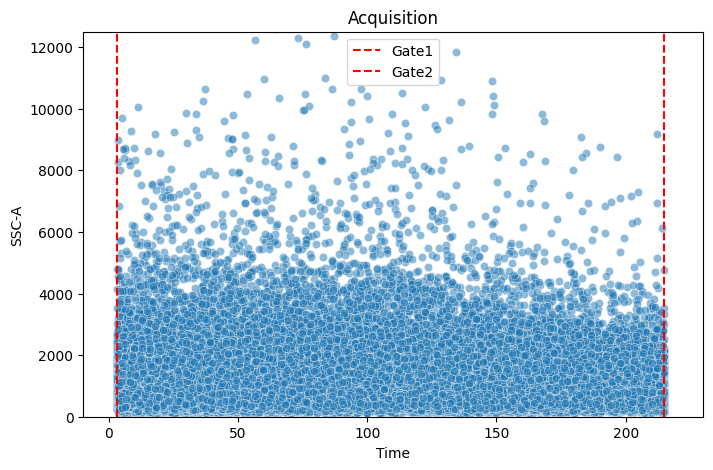

In [25]:
# Create the scatter plot
plt.figure(figsize=(8, 5))
sns.scatterplot(data=pbmc_c, x='Time', y='SSC-A', alpha=0.5)

# Set plot labels and title
plt.title('Acquisition')
plt.xlabel('Time')
plt.ylabel('SSC-A')

# Set x and y axis limits
plt.xlim(-10, 230)
plt.ylim(0, 12500)

# Determine the x-value for the vertical lines
x_lim1 = 3    # Change this value based on the data
x_lim2 = 215  # Change this value based on the data

# Draw the vertical lines
plt.axvline(x=x_lim1, color='red', linestyle='--', label='Gate1')
plt.axvline(x=x_lim2, color='red', linestyle='--', label='Gate2')

# Add a legend to explain the lines
plt.legend()

# Show the plot
plt.show()

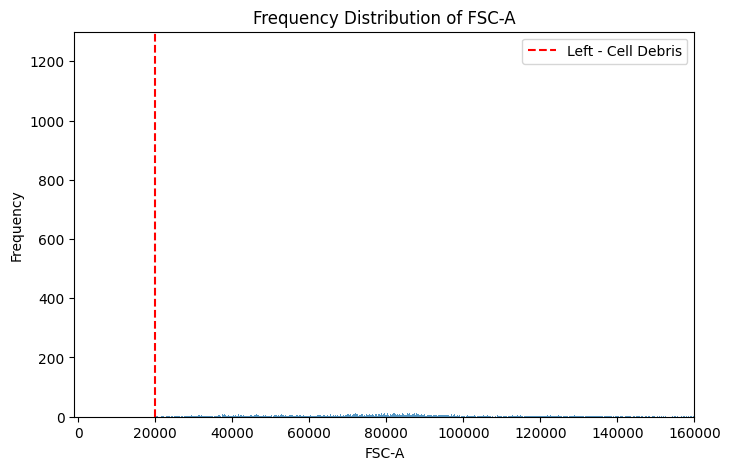

In [26]:
# Create a histogram
plt.figure(figsize=(8, 5))
sns.histplot(pbmc_c['FSC-A'], bins=100000, kde=False)

# Set plot labels and title
plt.title('Frequency Distribution of FSC-A')
plt.xlabel('FSC-A')
plt.ylabel('Frequency')

# Set x and y axis limits
plt.xlim(-1000, 160000)
plt.ylim(0, 1300)

# Determine the x-value for the vertical line
first_convex_x = 20000

# Draw the vertical line
plt.axvline(x=first_convex_x, color='red', linestyle='--', label='Left - Cell Debris')

# Add a legend to explain the line
plt.legend()

# Plot
plt.show()

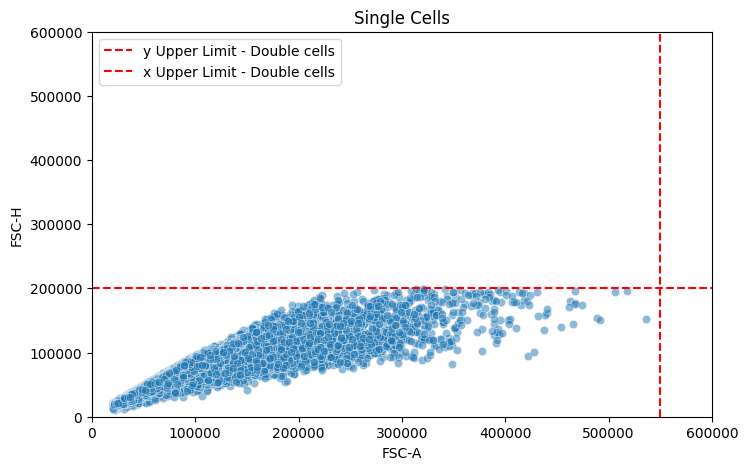

In [27]:
# Create the scatter plot
plt.figure(figsize=(8, 5))
sns.scatterplot(data=pbmc_c, x='FSC-A', y='FSC-H', alpha=0.5)

# Set plot labels and title
plt.title('Single Cells')
plt.xlabel('FSC-A')
plt.ylabel('FSC-H')

# Set x and y axis limits
plt.xlim(0, 600000)
plt.ylim(0, 600000)

# Determine the y-value for the horizontal line
y_lim = 200000  # Change this value based on the data

# Determine the x-value for the vertical line
x_lim = 550000  # Change this value based on the data

# Draw the horizontal line
plt.axhline(y=y_lim, color='red', linestyle='--', label='y Upper Limit - Double cells')

# Draw the vertical line
plt.axvline(x=x_lim, color='red', linestyle='--', label='x Upper Limit - Double cells')

# Add a legend to explain the lines
plt.legend()

# Show the plot
plt.show()

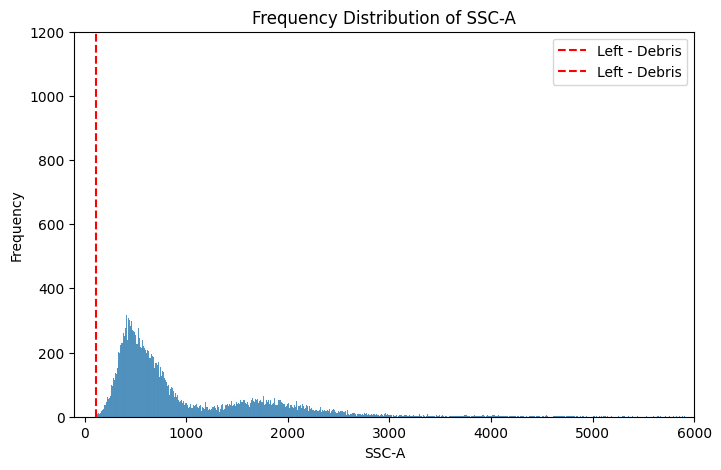

In [28]:
# Create a histogram
plt.figure(figsize=(8, 5))
sns.histplot(pbmc_c['SSC-A'], bins=10000)

# Set plot labels and title
plt.title('Frequency Distribution of SSC-A')
plt.xlabel('SSC-A')
plt.ylabel('Frequency')

# Set x and y axis limits
plt.xlim(-100, 6000)
plt.ylim(0, 1200)

# Determine the x-value for the vertical line
x_lower = 110                           # Change this value based on the data
x_upper = 20000                         # Change this value based on the data

# Draw the vertical line
plt.axvline(x=x_lower, color='red', linestyle='--', label='Left - Debris')
plt.axvline(x=x_upper, color='red', linestyle='--', label='Left - Debris')

# Add a legend to explain the line
plt.legend()

# Plot
plt.show()

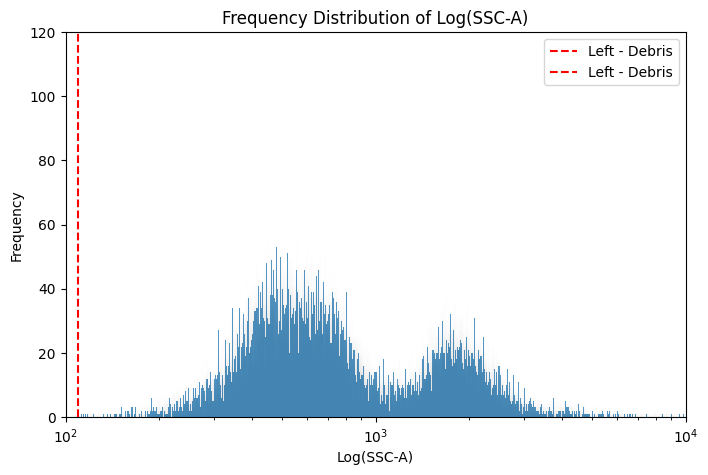

In [29]:
# Create a histogram
plt.figure(figsize=(8, 5))
sns.histplot(pbmc_c['SSC-A'], bins=10000, log_scale=True)

# Set plot labels and title
plt.title('Frequency Distribution of Log(SSC-A)')
plt.xlabel('Log(SSC-A)')
plt.ylabel('Frequency')

# Set x and y axis limits
plt.xlim(100, 10000)
plt.ylim(0, 120)

# Determine the x-value for the vertical line
x_lower = 110                           # Change this value based on the data
x_upper = 20000                         # Change this value based on the data

# Draw the vertical line
plt.axvline(x=x_lower, color='red', linestyle='--', label='Left - Debris')
plt.axvline(x=x_upper, color='red', linestyle='--', label='Left - Debris')

# Add a legend to explain the line
plt.legend()

# Plot
plt.show()

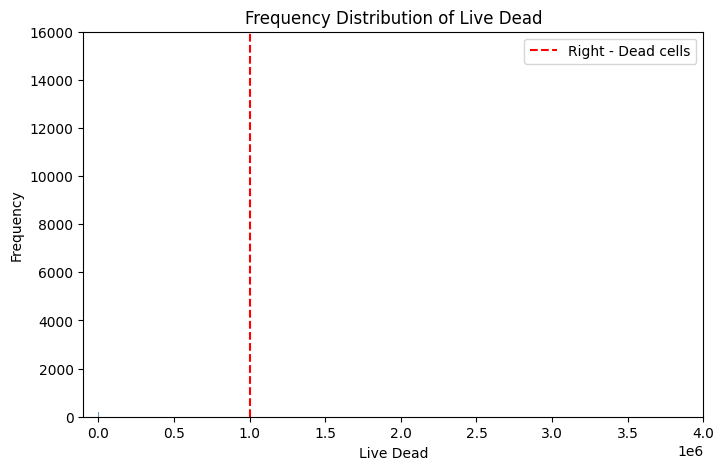

In [30]:
# Create a histogram
plt.figure(figsize=(8, 5))
sns.histplot(pbmc_c['Live Dead UV Blue'], bins=30000)

# Set plot labels and title
plt.title('Frequency Distribution of Live Dead')
plt.xlabel('Live Dead')
plt.ylabel('Frequency')

# Set x and y axis limits
plt.xlim(-100000, 4000000)
plt.ylim(0, 16000)

# Determine the x-value for the vertical line
x_lim = 1000000                       # Change this value based on the data

# Draw the vertical line
plt.axvline(x=x_lim, color='red', linestyle='--', label='Right - Dead cells')

# Add a legend to explain the line
plt.legend()

# Plot
plt.show()

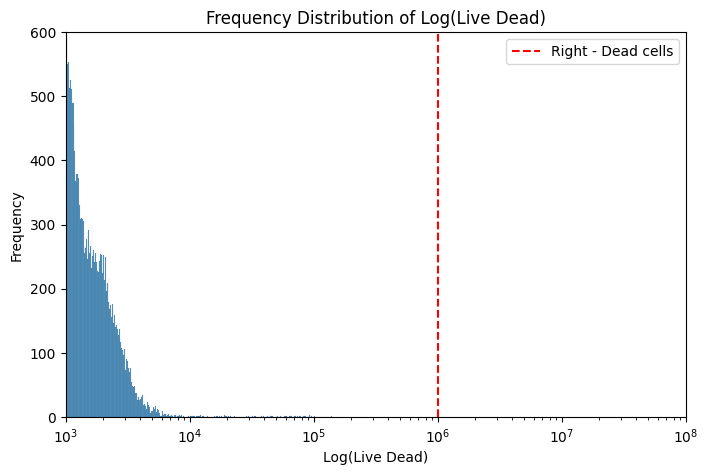

In [31]:
# Create a histogram
plt.figure(figsize=(8, 5))
sns.histplot(pbmc_c['Live Dead UV Blue'], bins=1000, log_scale=True)

# Set plot labels and title
plt.title('Frequency Distribution of Log(Live Dead)')
plt.xlabel('Log(Live Dead)')
plt.ylabel('Frequency')

# Set x and y axis limits
plt.xlim(1000, 100000000)
plt.ylim(0, 600)

# Determine the x-value for the vertical line
first_convex_x = 1000000                       # Change this value based on the data

# Draw the vertical line
plt.axvline(x=first_convex_x, color='red', linestyle='--', label='Right - Dead cells')

# Add a legend to explain the line
plt.legend()

# Plot
plt.show()

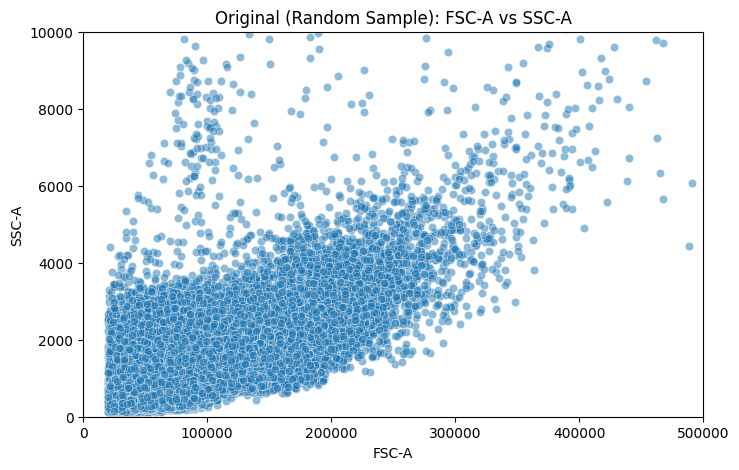

In [32]:
# Create the scatter plot
plt.figure(figsize=(8, 5))
sns.scatterplot(data=pbmc_c, x='FSC-A', y='SSC-A', alpha=0.5)

# Set plot labels and title
plt.title('Original (Random Sample): FSC-A vs SSC-A')
plt.xlabel('FSC-A')
plt.ylabel('SSC-A')

# Set x and y axis limits
plt.xlim(0, 500000)
plt.ylim(0, 10000)

# Plot
plt.show()

## EDA: Full Data Visualization

In [33]:
# Upload Dataset from Google Drive
pbmc_clean = pd.read_csv("pbmc_clean.csv")

# Display the shape of the DataFrame
print("Number of instances and features:", pbmc_clean.shape)

Number of instances and features: (1956288, 13)


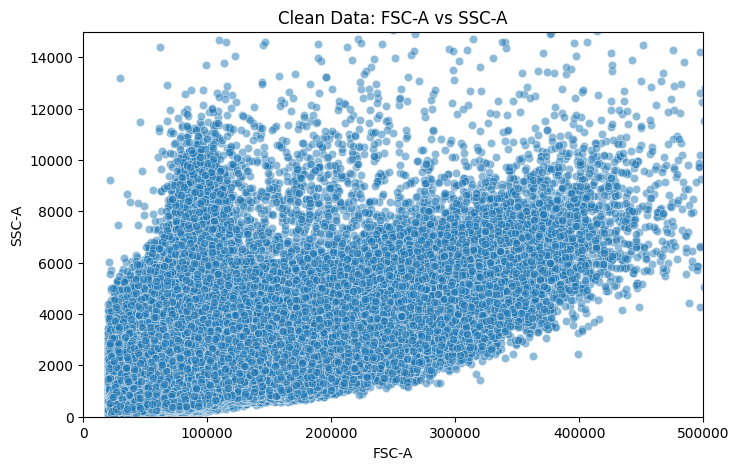

In [34]:
# Create the scatter plot
plt.figure(figsize=(8, 5))
sns.scatterplot(data=pbmc_clean, x='FSC-A', y='SSC-A', alpha=0.5)

# Set plot labels and title
plt.title('Clean Data: FSC-A vs SSC-A')
plt.xlabel('FSC-A')
plt.ylabel('SSC-A')

# Set x and y axis limits
plt.xlim(0, 500000)
plt.ylim(0, 15000)

# Plot
plt.show()

# Data Preprocessing: Transform Data for Efficient Computation and Memory Use

## Option 1: Downsample data to 10% (or change sample_fraction, as needed)
Method: KMeans Cluster-based Stratified Sampling \
Resulting Transformed DataFrame: **sampled_data** \
Justification: Scale data proportionally while preserving maximum relative cluster density

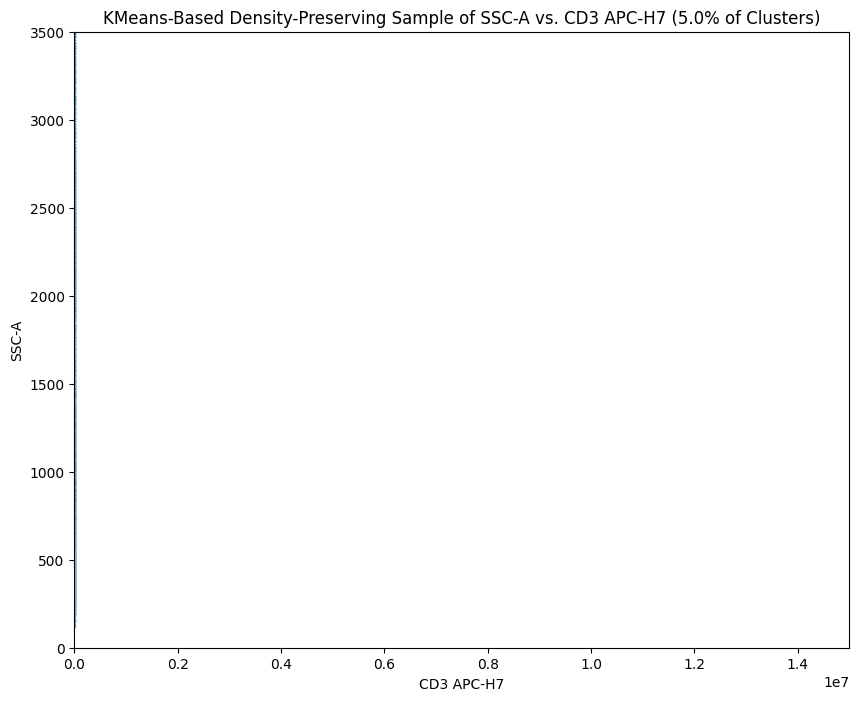

Duration for this cell0: 0:00:01.778602


In [35]:
start_time = datetime.datetime.now()

from sklearn.cluster import KMeans

x = 'CD3 APC-H7'
y = 'SSC-A'

columns_to_use = ['FSC-A', 'FSC-H', 'SSC-A', 'CD123 BB660', 'CD14 BV510', 'HLA-DR BV786',
                  'Live Dead UV Blue', 'CD20 BUV805', 'CD11c APC', 'CD45RA Ax700', 'CD3 APC-H7', 'CD19 PE-Cy5']

# Apply KMeans to cluster the data
kmeans = KMeans(n_clusters=10, random_state=42)  # Adjust the number of clusters, as needed
pbmc_clean['km_root_cluster'] = kmeans.fit_predict(pbmc_clean[columns_to_use])

# Perform stratified sampling based on clusters (larger clusters favored)
sample_fraction = 0.05  # Sample 10% of each cluster; change as needed
sampled_data = pbmc_clean.groupby('km_root_cluster', group_keys=False).apply(
    lambda x: x.sample(frac=sample_fraction, random_state=42)).reset_index(drop=True)

# Visualize the sampled data
plt.figure(figsize=(10, 8))
sns.scatterplot(data=sampled_data, x=x, y=y, s=1, alpha=0.7)
plt.title(f"KMeans-Based Density-Preserving Sample of {y} vs. {x} ({sample_fraction*100}% of Clusters)")
plt.xlim(0, 15000000)
plt.ylim(0, 3500)
plt.xlabel(x)
plt.ylabel(y)
plt.show()

end_time = datetime.datetime.now()
duration0 = end_time - start_time
print(f"Duration for this cell0: {duration0}")

### Apply Gaussian Mixture Model (GMM) for Clustering
Justification: GMM favors elliptical clusters, which may fit cellular shapes

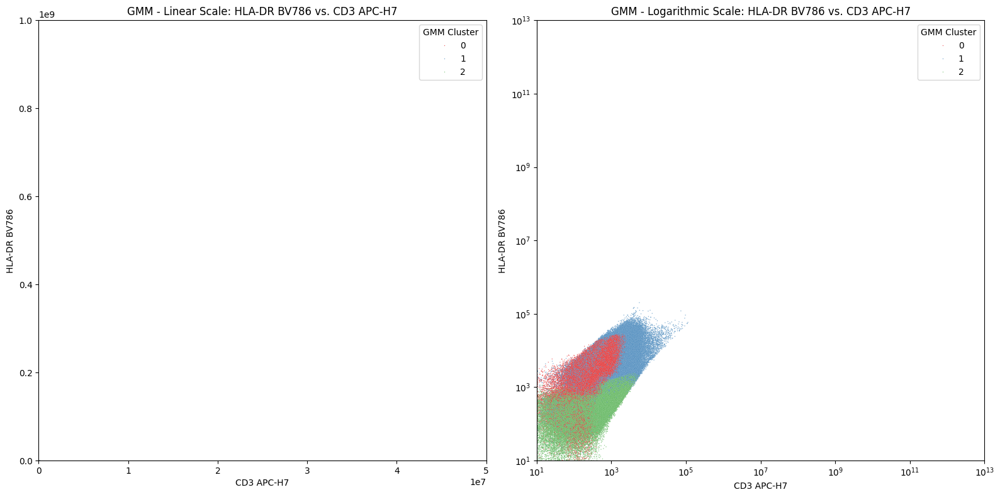

Duration for this cell1: 0:00:35.359519


In [36]:
start_time = datetime.datetime.now()

from sklearn.mixture import GaussianMixture

# Define the columns to use for clustering
x = 'CD3 APC-H7'
y = 'HLA-DR BV786'
df = pbmc_clean.copy() # Use pbmc_clean.copy() or sampled_data.copy() as needed

# Apply GMM with 3 clusters
gmm = GaussianMixture(n_components=3, random_state=599)
gmm.fit(df[columns_to_use])

# Predict GMM cluster labels
df['gmm_cluster'] = gmm.predict(df[columns_to_use])

# Subplots for linear and logarithmic scales for easier viewing
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Linear scale plot
sns.scatterplot(
    ax=axes[0],
    data=df,
    x=x,
    y=y,
    hue='gmm_cluster',
    palette='Set1',
    s=1,
    alpha=0.7
)
axes[0].set_xlim(0, 50000000)
axes[0].set_ylim(0, 1000000000)
axes[0].set_title(f"GMM - Linear Scale: {y} vs. {x}")
axes[0].set_xlabel(x)
axes[0].set_ylabel(y)
axes[0].legend(title="GMM Cluster", loc='upper right')

# Logarithmic scale plot
sns.scatterplot(
    ax=axes[1],
    data=df,
    x=x,
    y=y,
    hue='gmm_cluster',
    palette='Set1',
    s=1,
    alpha=0.7
)
axes[1].set_xscale('log')
axes[1].set_yscale('log')
axes[1].set_xlim(10**1, 10**13)
axes[1].set_ylim(10**1, 10**13)
axes[1].set_title(f"GMM - Logarithmic Scale: {y} vs. {x}")
axes[1].set_xlabel(x)
axes[1].set_ylabel(y)
axes[1].legend(title="GMM Cluster", loc='upper right')

plt.tight_layout()
plt.show()

end_time = datetime.datetime.now()
duration1 = end_time - start_time
print(f"Duration for this cell1: {duration1}")

### Apply DBSCAN Algorithm
Justification: Number of clusters cannot be known apriori, which this algorithm automatically determines by density parameters (cluster radius and minimum data per cluster)

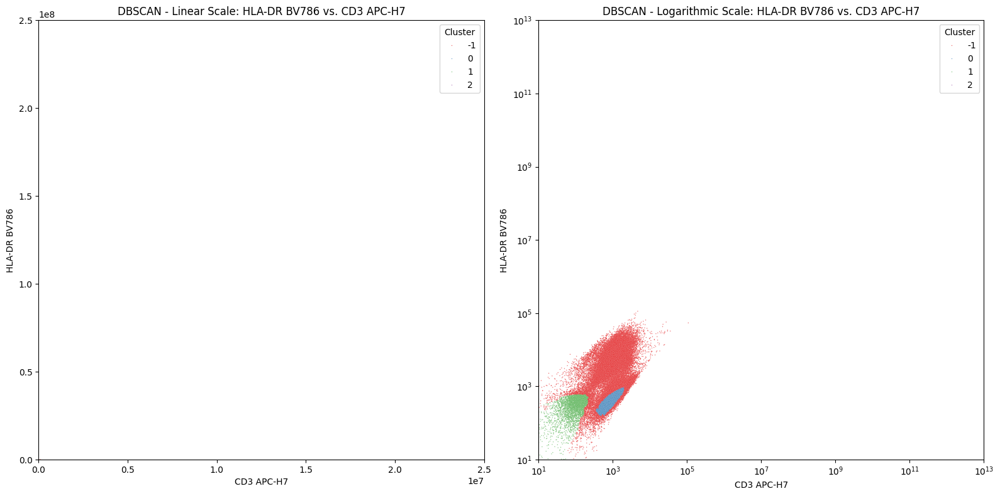

Duration for this cell2: 0:00:01.601077


In [37]:
start_time = datetime.datetime.now()

from sklearn.cluster import DBSCAN

# Define the columns to use for clustering
x = 'CD3 APC-H7'
y = 'HLA-DR BV786'
df = sampled_data.copy() # Use pbmc_clean.copy() or sampled_data.copy() as needed

columns_to_use = [x, y]

# Apply DBSCAN with specified parameters
dbscan = DBSCAN(eps=30, min_samples=110)
dbscan_labels = dbscan.fit_predict(df[columns_to_use])

# Add the cluster labels to the dataframe
df['DB_Cluster'] = dbscan_labels
db_df = df.copy()
# Subplots for linear and logarithmic scales for easier viewing
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Linear plot
sns.scatterplot(
    ax=axes[0],
    data=df,
    x=x,
    y=y,
    hue='DB_Cluster',
    palette='Set1',
    s=1,
    alpha=0.7
)
axes[0].set_xlim(0, 25000000)
axes[0].set_ylim(0, 250000000)
axes[0].set_title(f"DBSCAN - Linear Scale: {y} vs. {x}")
axes[0].set_xlabel(x)
axes[0].set_ylabel(y)
axes[0].legend(title="Cluster", loc='upper right')

# Logarithmic plot
sns.scatterplot(
    ax=axes[1],
    data=df,
    x=x,
    y=y,
    hue='DB_Cluster',
    palette='Set1',
    s=1,
    alpha=0.7
)
axes[1].set_xscale('log')
axes[1].set_yscale('log')
axes[1].set_xlim(10**1, 10**13)
axes[1].set_ylim(10**1, 10**13)
axes[1].set_title(f"DBSCAN - Logarithmic Scale: {y} vs. {x}")
axes[1].set_xlabel(x)
axes[1].set_ylabel(y)
axes[1].legend(title="Cluster", loc='upper right')

plt.tight_layout()
plt.show()

end_time = datetime.datetime.now()
duration2 = end_time - start_time
print(f"Duration for this cell2: {duration2}")

## Option 2: Principal Component Analysis
Resulting Transformed DataFrame: **pbmc_clean_pca_df** \
Justification: Dimensionality reduction to transform 14 columns into fewer components

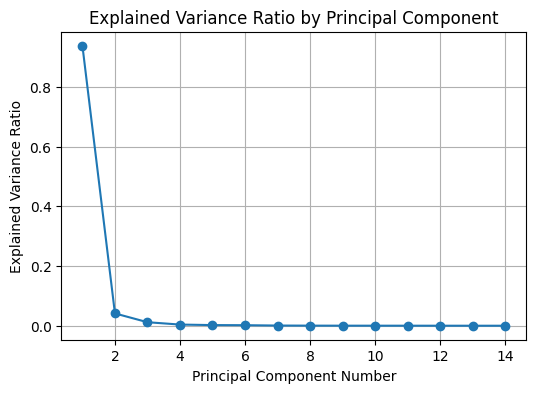

In [38]:
# Fit PCA on the sampling data
pca = PCA().fit(pbmc_clean)

# Plot the explained variance ratio
plt.figure(figsize=(6, 4))
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1),
         pca.explained_variance_ratio_, marker='o')
plt.title('Explained Variance Ratio by Principal Component')
plt.xlabel('Principal Component Number')
plt.ylabel('Explained Variance Ratio')
plt.grid()
plt.show()

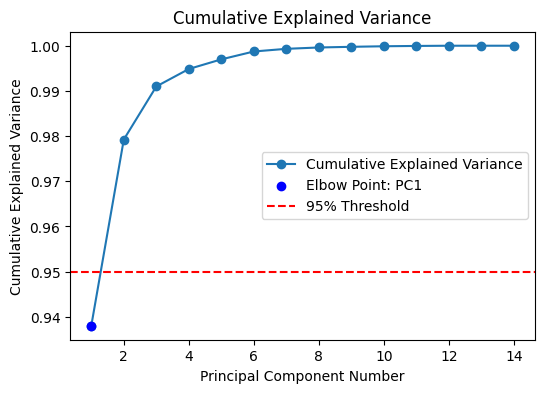

Duration for this cell3: 0:00:00.133118


In [39]:
start_time = datetime.datetime.now()

# Fit PCA on the sampling data
pca = PCA().fit(pbmc_clean)

# Calculate cumulative explained variance
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

# Find the elbow point
# Calculate the difference in the cumulative variance to find the point of maximum change
diff = np.diff(cumulative_variance)
elbow_point = np.argmax(diff) + 1

# Plot the cumulative explained variance
plt.figure(figsize=(6, 4))
plt.plot(range(1, len(cumulative_variance) + 1),
         cumulative_variance,
         marker='o',
         label='Cumulative Explained Variance')

# Add the elbow point to the plot
plt.scatter(elbow_point, cumulative_variance[elbow_point - 1], color='b', zorder=5, label=f'Elbow Point: PC{elbow_point}')

# Add 95% threshold line
plt.axhline(y=0.95, color='r', linestyle='--', label='95% Threshold')

# Titles and labels
plt.title('Cumulative Explained Variance')
plt.xlabel('Principal Component Number')
plt.ylabel('Cumulative Explained Variance')

# Show the legend and grid
plt.legend()
plt.show()


end_time = datetime.datetime.now()
duration3 = end_time - start_time
print(f"Duration for this cell3: {duration3}")

In [40]:
start_time = datetime.datetime.now()


from sklearn.decomposition import PCA
from sklearn.mixture import GaussianMixture

# # Define the columns to use for PCA
columns_to_use = ['FSC-A', 'FSC-H', 'SSC-A', 'CD123 BB660', 'CD14 BV510', 'HLA-DR BV786',
                  'Live Dead UV Blue', 'CD20 BUV805', 'CD11c APC', 'CD45RA Ax700',
                  'CD3 APC-H7', 'CD19 PE-Cy5']

# PCA Transformation with 3 Components
pca = PCA(n_components=3, random_state=599)  # Use 3 components
pca_result = pca.fit_transform(pbmc_clean[columns_to_use])

# Create a new DataFrame with the PCA results
pbmc_clean_pca_df = pbmc_clean.copy()
pbmc_clean_pca_df['PCA1'] = pca_result[:, 0]
pbmc_clean_pca_df['PCA2'] = pca_result[:, 1]
pbmc_clean_pca_df['PCA3'] = pca_result[:, 2]


end_time = datetime.datetime.now()
duration4 = end_time - start_time
print(f"Duration for this cell4: {duration4}")

Duration for this cell4: 0:00:00.185593


### Optional: 3D PCA Plot

In [41]:
# # Sample random points from the combined dataset for visualization
# sampled_df = pbmc_clean_pca_df.sample(n=1000, random_state=42)

# # Create the interactive 3D plot with the sampled data
# fig = px.scatter_3d(sampled_df, x='PCA1', y='PCA2', z='PCA3', color = 'PCA3',
#                    labels={'PCA1': 'PCA 1',
#                            'PCA2': 'PCA 2',
#                            'PCA3': 'PCA 3'},
#                    title='Sampling Set: PCA of Flow Cytometry Data')

# # Show the plot
# fig.show()

## Option 3: PCA+T-Distributed Stochastic Neighbor Embedding (Probabilistic)
Resulting Transformed DataFrame: **sample_tsne_df** \
Justification: openTSNE is optimized for larger datasets than scikit-learn version \
Wall Time: 2 min

In [42]:
from openTSNE import TSNE

In [43]:
start_time = datetime.datetime.now()

open_tsne = TSNE(n_components=2, perplexity=30, n_jobs=-1, random_state=42)
sample_size = 100000
sample_tsne = open_tsne.fit(pca_result[:sample_size])
sample_tsne_df = pd.DataFrame(sample_tsne, columns=['TSNE1', 'TSNE2'])

end_time = datetime.datetime.now()
duration5 = end_time - start_time
print(f"Duration for this cell5: {duration5}")

Duration for this cell5: 0:01:57.564398


# Modeling

## Model 1 - Gaussian Mixture Model
Assumptions:
- Clusters are elliptical due to the multi-dimensional Gaussian distribution shape (complicated with higher dimensions)
- There is no noise / All cells belong to a cluster \
Wall Time:

### From 5% Sampled Data

In [44]:
start_time = datetime.datetime.now()

from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score

# Define the range of clusters to test
n_components_range = range(2, 6)  # Testing from 2 to 5 components
silhouette_scores = []

data = sampled_data[columns_to_use].values

# Find the optimal number of components using Silhouette Score
for n_components in n_components_range:
    gmm = GaussianMixture(n_components=n_components, random_state=599,
                          reg_covar=1e-5)
    labels = gmm.fit_predict(data)

    # Calculate Silhouette Score
    score = silhouette_score(data, labels)
    silhouette_scores.append(score)
    print(f"n_components: {n_components}, Silhouette Score: {score:.4f}")

# Determine the optimal number of components
optimal_n_components = n_components_range[np.argmax(silhouette_scores)]
optimal_score = max(silhouette_scores)

print(f"\nOptimal number of components: {optimal_n_components}")
print(f"Optimal Silhouette Score: {optimal_score:.4f}")

end_time = datetime.datetime.now()
duration_down = end_time - start_time
print(f"Duration for this cell: {duration_down}")

n_components: 2, Silhouette Score: 0.1863
n_components: 3, Silhouette Score: 0.1159
n_components: 4, Silhouette Score: -0.0058
n_components: 5, Silhouette Score: -0.0153

Optimal number of components: 2
Optimal Silhouette Score: 0.1863
Duration for this cell: 0:05:14.816989


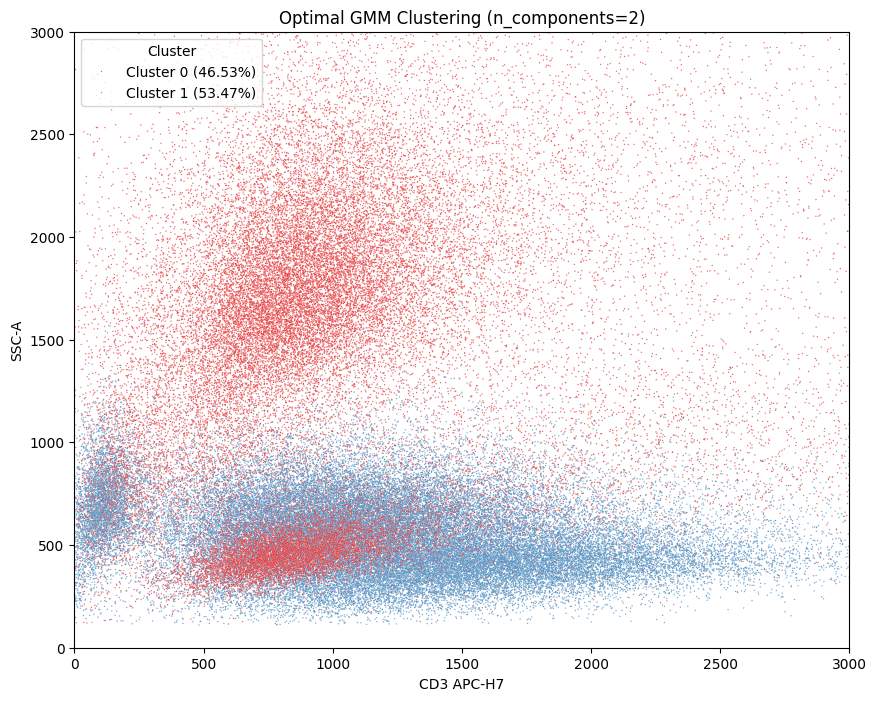

Duration for this cell6: 0:00:01.477468


In [45]:
start_time = datetime.datetime.now()

# Fit GMM with the optimal number of components
optimal_gmm = GaussianMixture(n_components=optimal_n_components, random_state=599)
optimal_labels = optimal_gmm.fit_predict(data)

# Add the labels back
sampled_data['Cluster'] = optimal_labels

# Calculate the percentage of points in each cluster
cluster_percentages = sampled_data['Cluster'].value_counts(normalize=True) * 100

# Prepare cluster labels
legend_labels = {
    cluster: f"Cluster {cluster} ({percentage:.2f}%)"
    for cluster, percentage in cluster_percentages.items()
}

# Plot the clusters
plt.figure(figsize=(10, 8))
scatter = sns.scatterplot(data=sampled_data,
                          x='CD3 APC-H7',
                          y='SSC-A',
                          hue='Cluster',
                          palette='Set1',
                          s=1,
                          alpha=0.7)

# Update the legend labels to include percentages
handles, labels = scatter.get_legend_handles_labels()
new_labels = [legend_labels[int(label)] for label in labels if label.isdigit()]
scatter.legend(handles=handles, labels=new_labels, title="Cluster", loc='upper left')

plt.xlabel("CD3 APC-H7")
plt.ylabel("SSC-A")
plt.xlim(0, 3000)
plt.ylim(0, 3000)
plt.title(f"Optimal GMM Clustering (n_components={optimal_n_components})")
plt.show()


end_time = datetime.datetime.now()
duration6 = end_time - start_time
print(f"Duration for this cell6: {duration6}")

In [46]:
model = optimal_gmm
df = sampled_data.copy()
columns_to_use = ['FSC-A', 'FSC-H', 'SSC-A', 'CD123 BB660', 'CD14 BV510', 'HLA-DR BV786',
                  'Live Dead UV Blue', 'CD20 BUV805', 'CD11c APC', 'CD45RA Ax700',
                  'CD3 APC-H7', 'CD19 PE-Cy5']
data = df[columns_to_use].values
labels = model.fit_predict(data)
sampled_gmm_score = silhouette_score(data, labels)
sampled_gmm_score

0.18630547202212291

### From PCA Only

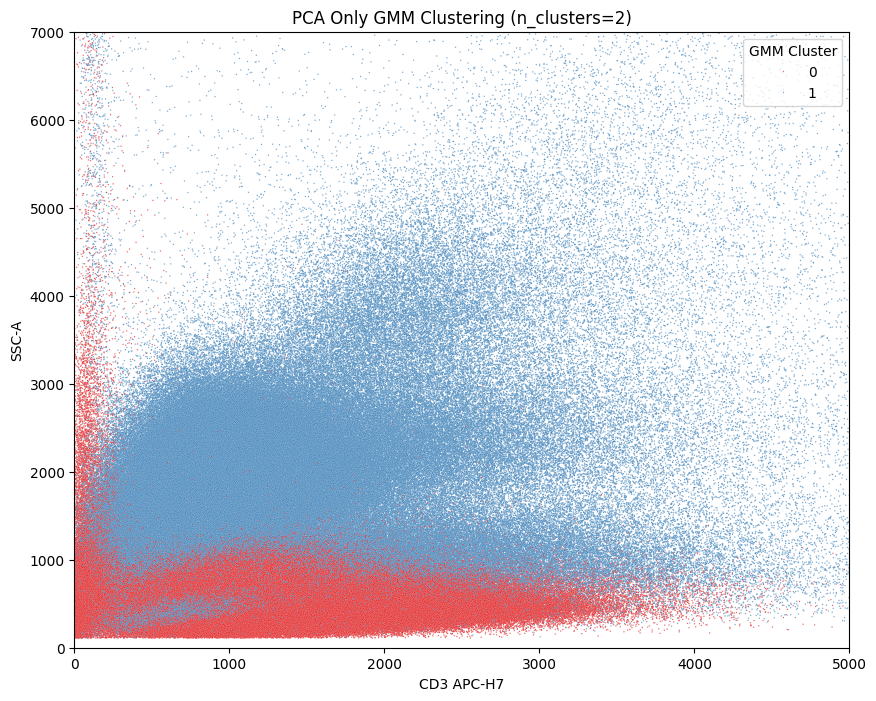

Duration for this cell8: 0:00:20.526729


In [47]:
start_time = datetime.datetime.now()


# GMM Clustering on the 3D PCA data
pca_gmm = GaussianMixture(n_components=optimal_n_components, random_state=599)  # Adjust n_components as needed
pbmc_clean_pca_df['gmm_cluster'] = pca_gmm.fit_predict(pca_result)

# Plotting the Original Features with GMM Clusters
plt.figure(figsize=(10, 8))
sns.scatterplot(
    data=pbmc_clean_pca_df,
    x='CD3 APC-H7',
    y='SSC-A',
    hue='gmm_cluster',
    palette='Set1',
    s=1,
    alpha=0.7
)
plt.title(f"PCA Only GMM Clustering (n_clusters={optimal_n_components})")
plt.xlim(0, 5000)
plt.ylim(0, 7000)
plt.xlabel("CD3 APC-H7")
plt.ylabel("SSC-A")
plt.legend(title="GMM Cluster", loc='upper right')
plt.show()


end_time = datetime.datetime.now()
duration8 = end_time - start_time
print(f"Duration for this cell8: {duration8}")

In [48]:
model = pca_gmm
df = pbmc_clean_pca_df.copy()
data = pca_result
labels = model.fit_predict(data)

# Combine features and labels
pca_with_labels = pd.DataFrame(data, columns=[f"PC{i+1}" for i in range(data.shape[1])])
pca_with_labels['cluster'] = labels

# Sample with replacement while maintaining stratification
''' Stratification is being performed by GMM cluster labels in order to best preserve
the model's cluster distribution when performing Silhouette Score calculation on a
downsampled version of this PCA plot. Without downsampling, calculating the Silhouette
Score would be excessively computationally expensive. This is different from the
sampling performed on preprocessing since this is downsampled after GMM performed labeling
and then stratified by that labeling.
'''
sample_size = 100000  # Desired total sample size
stratified_sample = pca_with_labels.groupby('cluster', group_keys=False).apply(
    lambda group: group.sample(
        n=int(sample_size * len(group) / len(pca_with_labels)),  # Proportional sampling
        replace=True,
        random_state=42
    )
)

# Extract sampled features and labels
sampled_features = stratified_sample.drop(columns=['cluster']).values
sampled_labels = stratified_sample['cluster'].values

# Calculate silhouette score
pca_gmm_score = silhouette_score(sampled_features, sampled_labels)
print(f"Silhouette Score on Stratified Sampled Data (With Replacement): {pca_gmm_score}")


Silhouette Score on Stratified Sampled Data (With Replacement): 0.2122198992827778


### From PCA+T-SNE

In [49]:
start_time = datetime.datetime.now()


tsne_gmm = GaussianMixture(n_components=optimal_n_components, random_state=42)
gmm_labels = tsne_gmm.fit_predict(sample_tsne_df[['TSNE1', 'TSNE2']])

sample_tsne_df['Cluster'] = gmm_labels

# Reset index of sample set to for merging
sample_reset = pbmc_clean.reset_index(drop=True)

# Merge the original sampling set data with the t-SNE cluster labels
sample_with_clusters = pd.concat([sample_reset, sample_tsne_df[['Cluster']]], axis=1)


end_time = datetime.datetime.now()
duration9 = end_time - start_time
print(f"Duration for this cell9: {duration9}")

Duration for this cell9: 0:00:00.448029


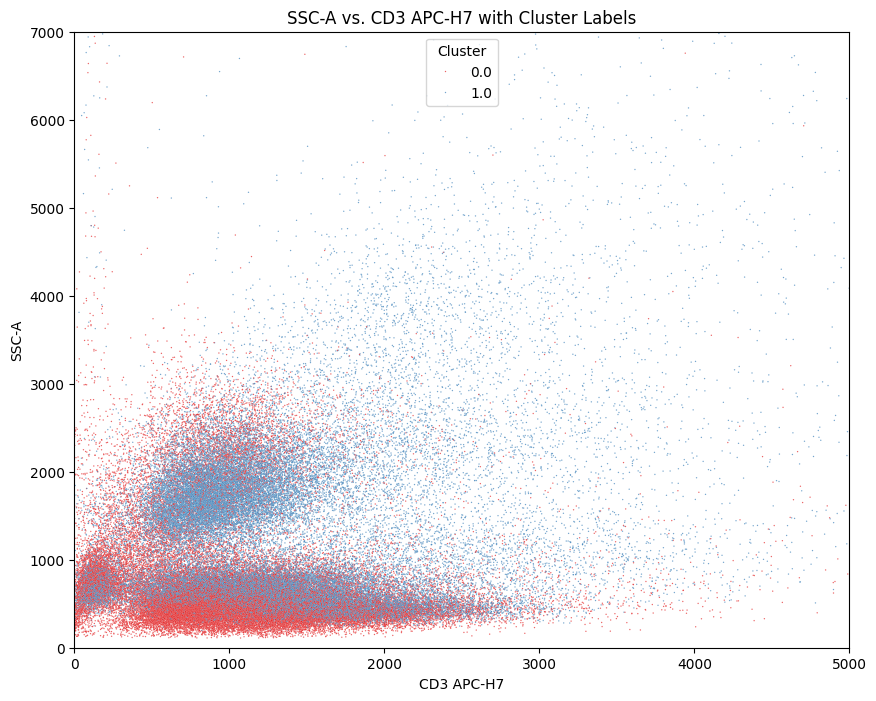

Duration for this cell10: 0:00:01.937016


In [50]:
start_time = datetime.datetime.now()


# Reset index of sample set to for merging
sample_reset = pbmc_clean.reset_index(drop=True)

# Merge the original sampling set data with the t-SNE cluster labels
sample_with_clusters = pd.concat([sample_reset, sample_tsne_df[['Cluster']]], axis=1)

# Plot "SSC-A" vs. "CD3 APC-H7" colored by cluster
plt.figure(figsize=(10, 8))
sns.scatterplot(data=sample_with_clusters,
                x='CD3 APC-H7',
                y='SSC-A',
                hue='Cluster',
                palette='Set1',
                s=1,
                alpha=0.7
)

plt.xlabel("CD3 APC-H7")
plt.ylabel("SSC-A")
plt.xlim(0, 5000)
plt.ylim(0, 7000)
plt.title("SSC-A vs. CD3 APC-H7 with Cluster Labels")
plt.legend(title="Cluster", loc='best')
plt.show()


end_time = datetime.datetime.now()
duration10 = end_time - start_time
print(f"Duration for this cell10: {duration10}")

In [51]:
model = tsne_gmm
df = sample_with_clusters.copy()
data = sample_tsne_df[['TSNE1', 'TSNE2']]
labels = model.fit_predict(data)
tsne_gmm_score = silhouette_score(data, labels)
tsne_gmm_score

0.34371093073754183

## Model 2 - K-Means Clustering
Assumptions:
- Clusters are spherically shaped since distance is measured from the cluster centroid \
- Not good against excessive noise since noise affects the cluster centroid location \
Wall Time: 9 min 41 sec

### From Sampled Data
Perform Cross-Validation by Silhouette Score to find optimal k value

In [52]:
start_time = datetime.datetime.now()


from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Define the range of clusters to test
n_clusters_range = range(2, 6)  # Testing from 2 to 5 clusters
silhouette_scores = []

data = sampled_data[['CD3 APC-H7', 'SSC-A']].values

# Find the optimal number of clusters by their Silhouette Score
for n_clusters in n_clusters_range:
    kmeans = KMeans(n_clusters=n_clusters, random_state=599)
    labels = kmeans.fit_predict(data)

    # Calculate Silhouette Score
    score = silhouette_score(data, labels)
    silhouette_scores.append(score)
    print(f"n_clusters: {n_clusters}, Silhouette Score: {score:.4f}")

# Store value of optimal number of clusters
optimal_n_clusters = n_clusters_range[np.argmax(silhouette_scores)]
optimal_score = max(silhouette_scores)

# Print to standard out for tracking purposes
print(f"\nOptimal number of clusters: {optimal_n_clusters}")
print(f"Optimal Silhouette Score: {optimal_score:.4f}")


end_time = datetime.datetime.now()
duration12 = end_time - start_time
print(f"Duration for this cell12: {duration12}")

n_clusters: 2, Silhouette Score: 0.4912
n_clusters: 3, Silhouette Score: 0.4335
n_clusters: 4, Silhouette Score: 0.4537
n_clusters: 5, Silhouette Score: 0.4153

Optimal number of clusters: 2
Optimal Silhouette Score: 0.4912
Duration for this cell12: 0:04:53.795820


In [53]:
start_time = datetime.datetime.now()

# Fit k-means with the optimal number of clusters
optimal_kmeans = KMeans(n_clusters=optimal_n_clusters, random_state=599)
optimal_labels = optimal_kmeans.fit_predict(data)

# Add the labels back to the dataframe for plotting
sampled_data['Cluster'] = optimal_labels

# Calculate the percentage of points in each cluster
cluster_percentages = sampled_data['Cluster'].value_counts(normalize=True) * 100

# Store cluster labels
legend_labels = {
    cluster: f"Cluster {cluster} ({percentage:.2f}%)"
    for cluster, percentage in cluster_percentages.items()
}

end_time = datetime.datetime.now()
duration13 = end_time - start_time
print(f"Duration for this cell13: {duration13}")

Duration for this cell13: 0:00:00.168678


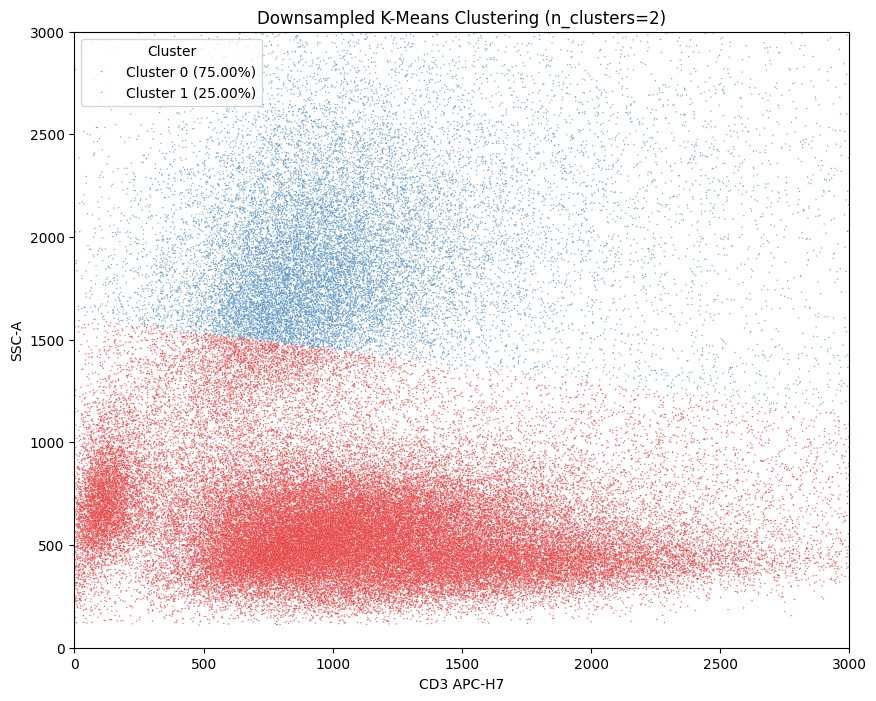

Duration for this cell14: 0:00:00.728313


In [54]:
start_time = datetime.datetime.now()

# Plot the clusters
plt.figure(figsize=(10, 8))
scatter = sns.scatterplot(data=sampled_data,
                          x='CD3 APC-H7',
                          y='SSC-A',
                          hue='Cluster',
                          palette='Set1',
                          s=1,
                          alpha=0.7)

# Update the legend labels to include percentages
handles, labels = scatter.get_legend_handles_labels()
new_labels = [legend_labels[int(label)] for label in labels if label.isdigit()]
scatter.legend(handles=handles, labels=new_labels, title="Cluster", loc='upper left')

plt.xlabel("CD3 APC-H7")
plt.ylabel("SSC-A")
plt.xlim(0, 3000)
plt.ylim(0, 3000)
plt.title(f"Downsampled K-Means Clustering (n_clusters={optimal_n_clusters})")
plt.show()


end_time = datetime.datetime.now()
duration14 = end_time - start_time
print(f"Duration for this cell14: {duration14}")

In [55]:
model = optimal_kmeans
df = sampled_data.copy()
columns_to_use = ['FSC-A', 'FSC-H', 'SSC-A', 'CD123 BB660', 'CD14 BV510', 'HLA-DR BV786',
                  'Live Dead UV Blue', 'CD20 BUV805', 'CD11c APC', 'CD45RA Ax700',
                  'CD3 APC-H7', 'CD19 PE-Cy5']
data = df[columns_to_use].values
labels = model.fit_predict(data)
sampled_km_score = silhouette_score(data, labels)
sampled_km_score

0.5456452149840225

### From PCA Only

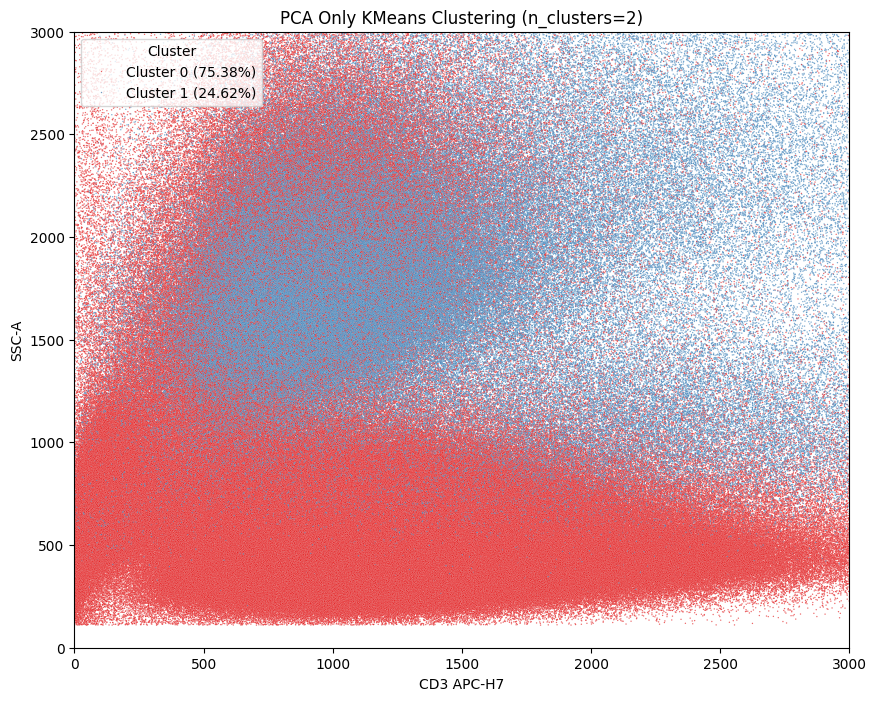

Duration for this cell15: 0:00:11.690889


In [56]:
start_time = datetime.datetime.now()

# KMeans Clustering
pca_kmeans = KMeans(n_clusters=optimal_n_clusters, random_state=599)
pbmc_clean_pca_df['Cluster'] = pca_kmeans.fit_predict(pca_result)

# Calculate the percentage of points in each cluster
cluster_percentages = pbmc_clean_pca_df['Cluster'].value_counts(normalize=True) * 100
legend_labels = {
    cluster: f"Cluster {cluster} ({percentage:.2f}%)"
    for cluster, percentage in cluster_percentages.items()
}

# Plot the clusters
plt.figure(figsize=(10, 8))
scatter = sns.scatterplot(data=pbmc_clean_pca_df,
                          x='CD3 APC-H7',
                          y='SSC-A',
                          hue='Cluster',
                          palette='Set1',
                          s=1,
                          alpha=0.7)

# Update the legend labels to include percentages
handles, labels = scatter.get_legend_handles_labels()
new_labels = [legend_labels[int(label)] for label in labels if label.isdigit()]
scatter.legend(handles=handles, labels=new_labels, title="Cluster", loc='upper left')

plt.xlabel("CD3 APC-H7")
plt.ylabel("SSC-A")
plt.xlim(0, 3000)
plt.ylim(0, 3000)
plt.title(f"PCA Only KMeans Clustering (n_clusters={optimal_n_clusters})")
plt.show()



end_time = datetime.datetime.now()
duration15 = end_time - start_time
print(f"Duration for this cell15: {duration15}")

In [57]:
model = pca_kmeans
df = pbmc_clean_pca_df.copy()
data = pca_result
labels = model.fit_predict(data)

# Combine features and labels
pca_with_labels = pd.DataFrame(data, columns=[f"PC{i+1}" for i in range(data.shape[1])])
pca_with_labels['cluster'] = labels

# Sample with replacement while maintaining stratification
''' Stratification is being performed by K-means cluster labels in order to best preserve
the model's cluster distribution when performing Silhouette Score calculation on a
downsampled version of this PCA plot. Without downsampling, calculating the Silhouette
Score would be excessively computationally expensive. This is different from the
sampling performed on preprocessing since this is downsampled after K-means performed labeling
and then stratified by that labeling.
'''
sample_size = 100000  # Desired total sample size
stratified_sample = pca_with_labels.groupby('cluster', group_keys=False).apply(
    lambda group: group.sample(
        n=int(sample_size * len(group) / len(pca_with_labels)),  # Proportional sampling
        replace=True,
        random_state=42
    )
)

# Extract sampled features and labels
sampled_features = stratified_sample.drop(columns=['cluster']).values
sampled_labels = stratified_sample['cluster'].values

# Calculate silhouette score
pca_km_score = silhouette_score(sampled_features, sampled_labels)
print(f"Silhouette Score on Stratified Sampled Data (With Replacement): {pca_km_score}")


Silhouette Score on Stratified Sampled Data (With Replacement): 0.5510940292625991


### From PCA+T-SNE sample_tsne_df

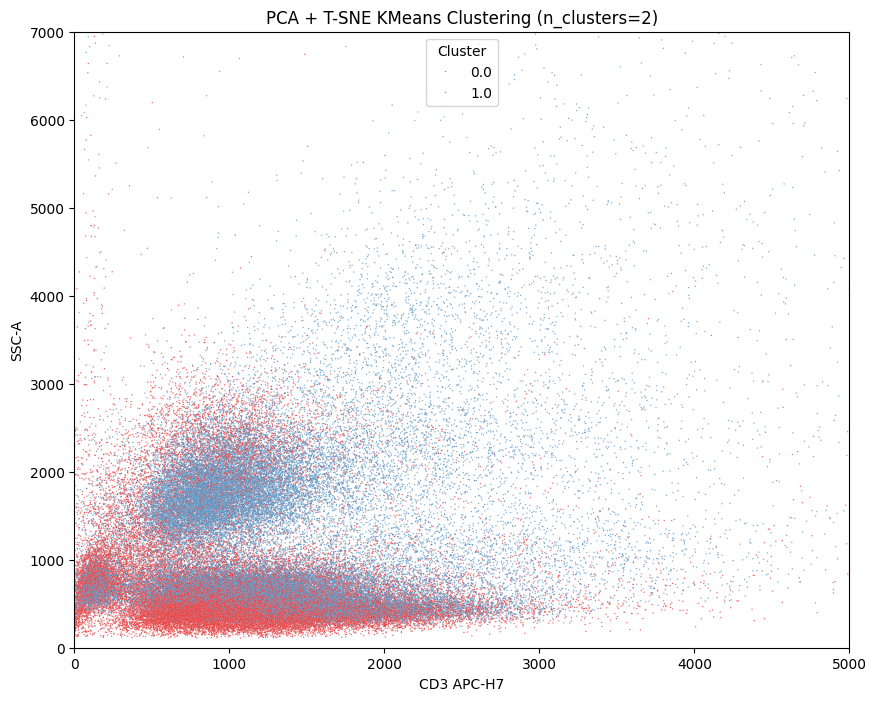

Duration for this cell16: 0:00:02.122209


In [58]:
start_time = datetime.datetime.now()

from sklearn.cluster import KMeans

# Apply KMeans to the t-SNE reduced data
tsne_kmeans = KMeans(n_clusters=optimal_n_clusters, random_state=42)
kmeans_labels = tsne_kmeans.fit_predict(sample_tsne_df[['TSNE1', 'TSNE2']])

# Add the KMeans cluster labels to the t-SNE DataFrame
sample_tsne_df['Cluster'] = kmeans_labels

# Reset index of pbmc_clean and merge with t-SNE cluster labels
sample_reset = pbmc_clean.reset_index(drop=True)
sample_with_clusters = pd.concat([sample_reset, sample_tsne_df[['Cluster']]], axis=1)

# Calculate the percentage of points in each cluster
cluster_percentages = sample_tsne_df['Cluster'].value_counts(normalize=True) * 100
legend_labels = {
    cluster: f"Cluster {cluster} ({percentage:.2f}%)"
    for cluster, percentage in cluster_percentages.items()
}

# Plot "SSC-A" vs. "CD3 APC-H7" colored by cluster
plt.figure(figsize=(10, 8))
scatter = sns.scatterplot(data=sample_with_clusters,
                          x='CD3 APC-H7',
                          y='SSC-A',
                          hue='Cluster',
                          palette='Set1',
                          s=1,
                          alpha=0.7
)

# Update the legend to include percentages
handles, labels = scatter.get_legend_handles_labels()
new_labels = [legend_labels[int(label)] for label in labels if label.isdigit()]
scatter.legend(handles=handles, labels=new_labels, title="Cluster", loc='best')

plt.xlabel("CD3 APC-H7")
plt.ylabel("SSC-A")
plt.xlim(0, 5000)
plt.ylim(0, 7000)
plt.title(f"PCA + T-SNE KMeans Clustering (n_clusters={optimal_n_clusters})")
plt.show()


end_time = datetime.datetime.now()
duration16 = end_time - start_time
print(f"Duration for this cell16: {duration16}")

In [59]:
model = tsne_kmeans
df = sample_with_clusters.copy()
data = sample_tsne_df[['TSNE1', 'TSNE2']]
labels = model.fit_predict(data)
tsne_km_score = silhouette_score(data, labels)
tsne_km_score

0.34367338255618773

## Model 3 - DBSCAN
Wall Time: 1 min 11 sec

### From Sampled Data

<Axes: xlabel='DB_Cluster'>

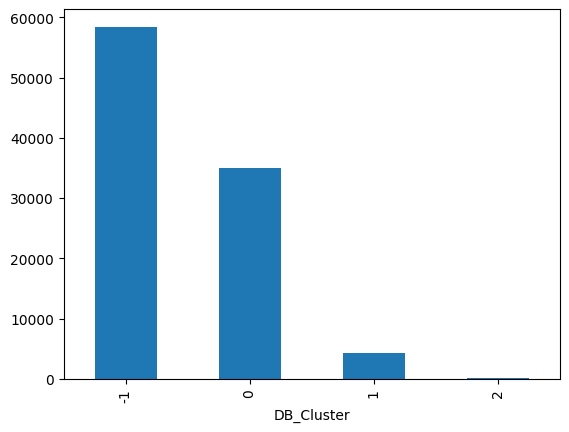

In [60]:
db_df['DB_Cluster'].value_counts().sort_index().plot(kind='bar')

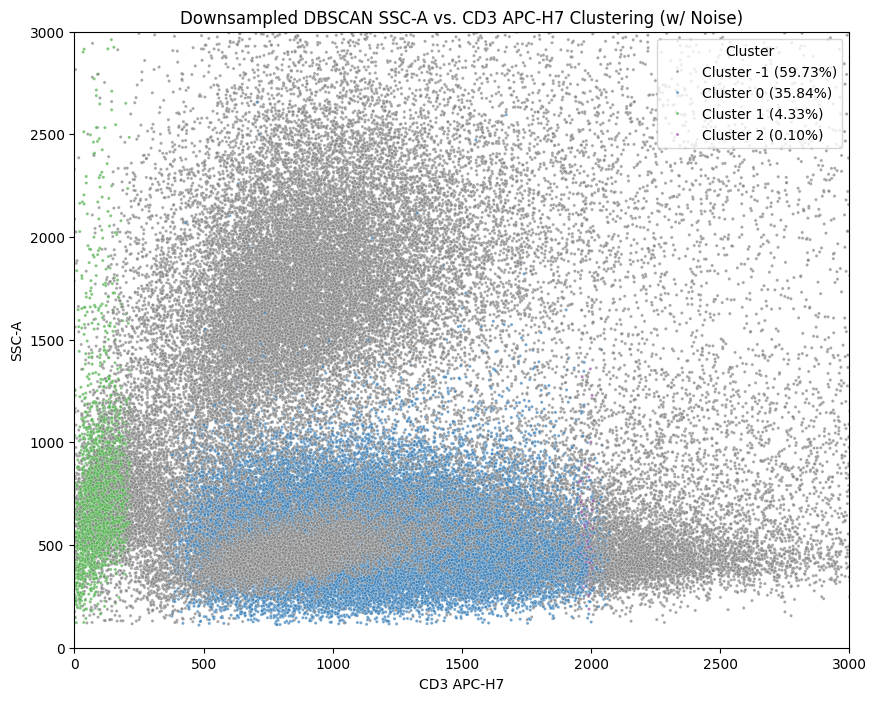

Duration for this cell17: 0:00:00.746937


In [61]:
start_time = datetime.datetime.now()

# Modify Set1 to handle noise (-1) as gray and clusters with color
unique_clusters = db_df['DB_Cluster'].unique()
custom_palette = {
    cluster: color
    for cluster, color in zip(sorted(unique_clusters), sns.color_palette("Set1", len(unique_clusters)))
}
# Ensure noise (-1) gets a consistent color
custom_palette[-1] = 'gray'  # Use gray to de-emphasize from actual clusters

# Update the cluster percentages to include noise
cluster_percentages = db_df['DB_Cluster'].value_counts(normalize=True) * 100
if -1 not in cluster_percentages:
    cluster_percentages[-1] = 0.0  # Add noise with 0% if it doesn't exist

legend_labels = {
    cluster: f"Cluster {cluster} ({percentage:.2f}%)"
    for cluster, percentage in cluster_percentages.items()
}

# Replot with corrected labels and palette
plt.figure(figsize=(10, 8))
plt.xlabel("CD3 APC-H7")
plt.ylabel("SSC-A")
plt.xlim(0, 3000)
plt.ylim(0, 3000)
plt.title("Downsampled DBSCAN SSC-A vs. CD3 APC-H7 Clustering (w/ Noise)")
scatter = sns.scatterplot(
    data=db_df,
    x='CD3 APC-H7',
    y='SSC-A',
    hue='DB_Cluster',
    palette=custom_palette,
    s=5,
    alpha=0.7
)

# Update the legend with percentages
handles, labels = scatter.get_legend_handles_labels()
new_labels = [legend_labels[int(label)] for label in labels if label.isdigit() or label == "-1"]
scatter.legend(handles=handles, labels=new_labels, title="Cluster", loc='upper right')

plt.show()

end_time = datetime.datetime.now()
duration17 = end_time - start_time
print(f"Duration for this cell17: {duration17}")

In [62]:
# Only consider points that are part of a valid cluster (exclude noise labeled as -1)
valid_labels = db_df[db_df['DB_Cluster'] != -1]['DB_Cluster']
valid_data = db_df[db_df['DB_Cluster'] != -1][['CD3 APC-H7', 'SSC-A']]
sampled_db_score = silhouette_score(valid_data, valid_labels)
sampled_db_score

0.24956961783264517

### From PCA Only
Wall Time: 2 min 14 sec

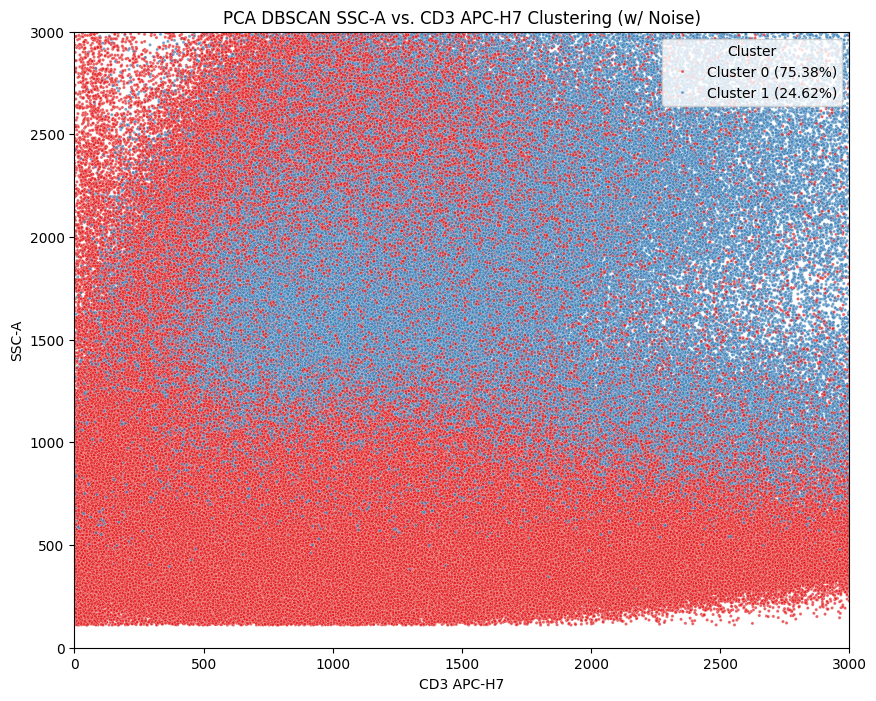

Duration for this cell18: 0:00:12.205357


In [63]:
start_time = datetime.datetime.now()

# Modify Set1 to handle noise (-1) as gray and clusters with color
unique_clusters = pbmc_clean_pca_df['Cluster'].unique()
custom_palette = {
    cluster: color
    for cluster, color in zip(sorted(unique_clusters), sns.color_palette("Set1", len(unique_clusters)))
}
# Ensure noise (-1) gets a consistent color
if -1 in unique_clusters:
    custom_palette[-1] = 'gray'  # Use gray to de-emphasize noise

# Calculate the percentage of points in each cluster, including noise
cluster_percentages = pbmc_clean_pca_df['Cluster'].value_counts(normalize=True) * 100
legend_labels = {
    cluster: f"Noise ({percentage:.2f}%)" if cluster == -1 else f"Cluster {cluster} ({percentage:.2f}%)"
    for cluster, percentage in cluster_percentages.items()
}

# Replot with corrected labels and palette
plt.figure(figsize=(10, 8))
scatter = sns.scatterplot(
    data=pbmc_clean_pca_df,
    x='CD3 APC-H7',
    y='SSC-A',
    hue='Cluster',
    palette=custom_palette,
    s=5,
    alpha=0.7
)

# Update the legend with percentages
handles, labels = scatter.get_legend_handles_labels()
new_labels = [
    legend_labels[int(label)] if label.isdigit() or label == "-1" else label
    for label in labels
]
scatter.legend(handles=handles, labels=new_labels, title="Cluster", loc='upper right')

plt.xlabel("CD3 APC-H7")
plt.ylabel("SSC-A")
plt.xlim(0, 3000)
plt.ylim(0, 3000)
plt.title("PCA DBSCAN SSC-A vs. CD3 APC-H7 Clustering (w/ Noise)")
plt.show()

end_time = datetime.datetime.now()
duration18 = end_time - start_time
print(f"Duration for this cell18: {duration18}")

In [64]:
# Only consider points that are part of a valid cluster (exclude noise labeled as -1)
valid_labels = pbmc_clean_pca_df[pbmc_clean_pca_df['Cluster'] != -1]['Cluster']
valid_data = pbmc_clean_pca_df[pbmc_clean_pca_df['Cluster'] != -1][['PCA1', 'PCA2']]
#pca_db_score = silhouette_score(valid_data, valid_labels)

In [65]:
# Combine data and labels for easier manipulation
valid_data_with_labels = pd.DataFrame(valid_data, columns=['PCA1', 'PCA2'])
valid_data_with_labels['Cluster'] = valid_labels.values

# Sample with replacement while maintaining stratification
''' Stratification is being performed by DBSCAN cluster labels in order to best preserve
the model's cluster distribution when performing Silhouette Score calculation on a
downsampled version of this PCA plot. Without downsampling, calculating the Silhouette
Score would be excessively computationally expensive. This is different from the
sampling performed on preprocessing since this is downsampled after DBSCAN performed labeling
and then stratified by that labeling.
'''
sample_size = 100000  # Desired total sample size
stratified_sample = valid_data_with_labels.groupby('Cluster', group_keys=False).apply(
    lambda group: group.sample(
        n=min(len(group), int(sample_size * len(group) / len(valid_data_with_labels))),
        replace=True,
        random_state=42
    )
)

# Extract sampled features and labels
sampled_features = stratified_sample[['PCA1', 'PCA2']].values
sampled_labels = stratified_sample['Cluster'].values

# Calculate silhouette score
pca_db_score = silhouette_score(sampled_features, sampled_labels)
print(f"Silhouette Score on Stratified Sampled Data (With Replacement): {pca_db_score}")


Silhouette Score on Stratified Sampled Data (With Replacement): 0.5618682551325294


**Not sure why there is no noise, but that there's three clusters. This is likely due to how the transformed dataframe used PCA to assign values back to the dataframe.**

### From PCA+T-SNE

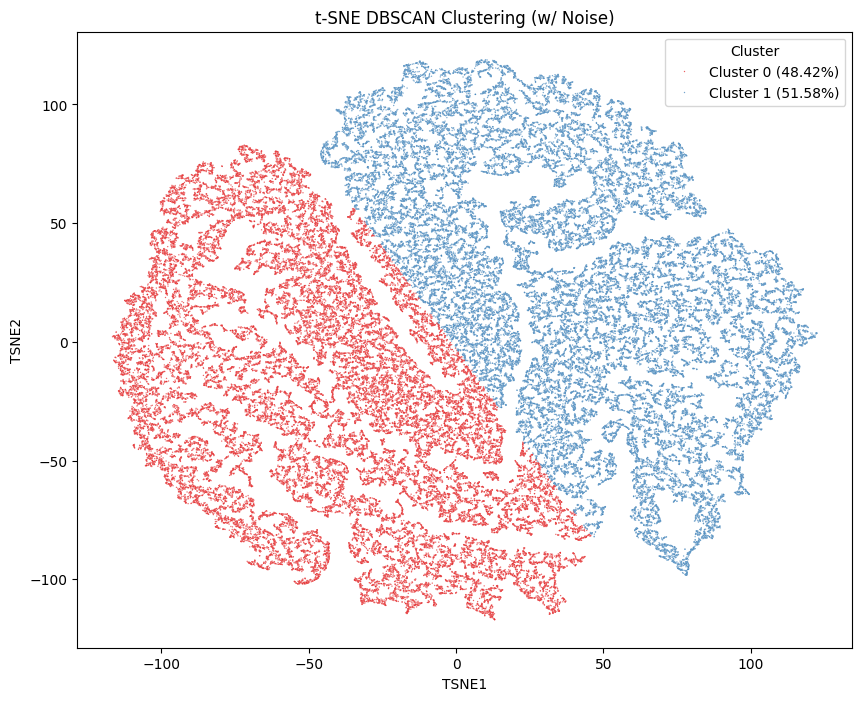

Duration for this cell19: 0:00:00.675670


In [66]:
start_time = datetime.datetime.now()

# Modify Set1 to handle noise (-1) as gray and clusters with color
unique_clusters = sample_tsne_df['Cluster'].unique()
custom_palette = {
    cluster: color
    for cluster, color in zip(sorted(unique_clusters), sns.color_palette("Set1", len(unique_clusters)))
}
# Ensure noise (-1) gets a consistent color
if -1 in unique_clusters:
    custom_palette[-1] = 'gray'  # Use gray to de-emphasize noise

# Calculate the percentage of points in each cluster, including noise
cluster_percentages = sample_tsne_df['Cluster'].value_counts(normalize=True) * 100
legend_labels = {
    cluster: f"Noise ({percentage:.2f}%)" if cluster == -1 else f"Cluster {cluster} ({percentage:.2f}%)"
    for cluster, percentage in cluster_percentages.items()
}

# Replot with corrected labels and palette
plt.figure(figsize=(10, 8))
scatter = sns.scatterplot(
    data=sample_tsne_df,
    x='TSNE1',
    y='TSNE2',
    hue='Cluster',
    palette=custom_palette,
    s=1,
    alpha=0.7
)

# Update the legend with percentages
handles, labels = scatter.get_legend_handles_labels()
new_labels = [
    legend_labels[int(label)] if label.isdigit() or label == "-1" else label
    for label in labels
]
scatter.legend(handles=handles, labels=new_labels, title="Cluster", loc='upper right')

plt.xlabel("TSNE1")
plt.ylabel("TSNE2")
plt.title("t-SNE DBSCAN Clustering (w/ Noise)")
plt.show()



end_time = datetime.datetime.now()
duration19 = end_time - start_time
print(f"Duration for this cell19: {duration19}")

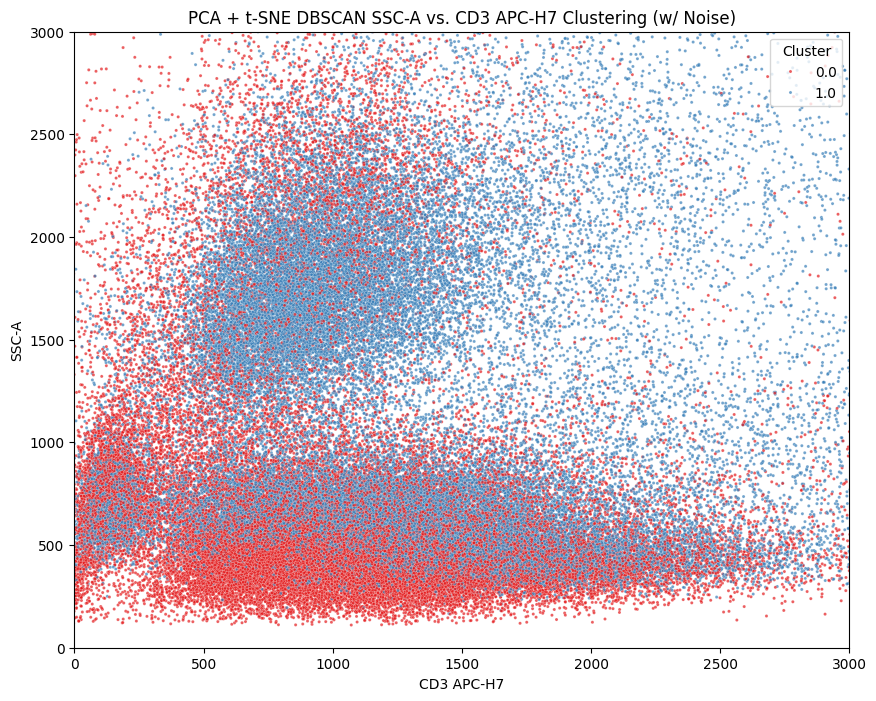

Duration for this cell20: 0:00:01.412622


In [67]:
start_time = datetime.datetime.now()

# Modify Set1 to handle noise (-1) as gray and clusters with color
unique_clusters = sample_tsne_df['Cluster'].unique()
custom_palette = {
    cluster: color
    for cluster, color in zip(sorted(unique_clusters), sns.color_palette("Set1", len(unique_clusters)))
}
# Ensure noise (-1) gets a consistent color
if -1 in unique_clusters:
    custom_palette[-1] = 'gray'  # Use gray to de-emphasize noise

# Calculate the percentage of points in each cluster, including noise
cluster_percentages = sample_tsne_df['Cluster'].value_counts(normalize=True) * 100
legend_labels = {
    cluster: f"Noise ({percentage:.2f}%)" if cluster == -1 else f"Cluster {cluster} ({percentage:.2f}%)"
    for cluster, percentage in cluster_percentages.items()
}

# Merge SSC-A and CD3 APC-H7 data from original data into sample_tsne_df
sample_reset = pbmc_clean.reset_index(drop=True)
sample_with_clusters = pd.concat([sample_reset, sample_tsne_df[['Cluster']]], axis=1)

# Replot with corrected labels and palette
plt.figure(figsize=(10, 8))
scatter = sns.scatterplot(
    data=sample_with_clusters,
    x='CD3 APC-H7',
    y='SSC-A',
    hue='Cluster',
    palette=custom_palette,
    s=5,
    alpha=0.7
)

# Update the legend with percentages
handles, labels = scatter.get_legend_handles_labels()
new_labels = [
    legend_labels[int(label)] if label.isdigit() or label == "-1" else label
    for label in labels
]
scatter.legend(handles=handles, labels=new_labels, title="Cluster", loc='upper right')

plt.xlabel("CD3 APC-H7")
plt.ylabel("SSC-A")
plt.xlim(0, 3000)
plt.ylim(0, 3000)
plt.title("PCA + t-SNE DBSCAN SSC-A vs. CD3 APC-H7 Clustering (w/ Noise)")
plt.show()

end_time = datetime.datetime.now()
duration20 = end_time - start_time
print(f"Duration for this cell20: {duration20}")

In [68]:
# Only consider points that are part of a valid cluster (exclude noise labeled as -1)
valid_labels = sample_tsne_df[sample_tsne_df['Cluster'] != -1]['Cluster']
valid_data = sample_tsne_df[sample_tsne_df['Cluster'] != -1][['TSNE1', 'TSNE2']]
tsne_db_score = silhouette_score(valid_data, valid_labels)

**Due to the ambiguious cluster labels, DBSCAN appears to be incompatible with PCA**

# Model Finding
-This particular file appears to have two clusters according to GMM and DBSCAN and three clusters according to K-Means. \
-DBSCAN appears to be negatively

## Model Performance Evaluation and Model Selection

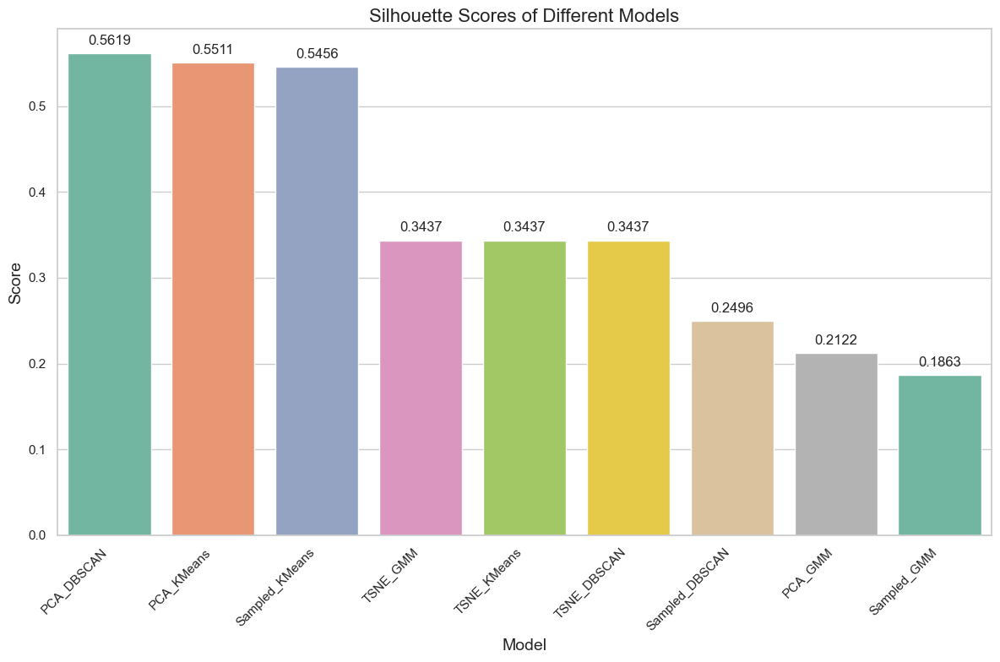

In [69]:
# Create labels and the corresponding durations for each model
labels = ['Sampled_GMM',
          'PCA_GMM',
          'TSNE_GMM',
          'Sampled_KMeans',
          'PCA_KMeans',
          'TSNE_KMeans',
          'Sampled_DBSCAN',
          'PCA_DBSCAN',
          'TSNE_DBSCAN'
         ]

scores = [sampled_gmm_score,
             pca_gmm_score,
             tsne_gmm_score,
             sampled_km_score,
             pca_km_score,
             tsne_km_score,
             sampled_db_score,
             pca_db_score,
             tsne_db_score
            ]

# Pair labels and scores, then sort by scores in descending order
sorted_pairs = sorted(zip(scores, labels), reverse=True, key=lambda x: x[0])
sorted_scores, sorted_labels = zip(*sorted_pairs)

# Convert tuples back to lists
sorted_scores = list(sorted_scores)
sorted_labels = list(sorted_labels)

# Set Seaborn style and color palette
sns.set(style="whitegrid")
colors = sns.color_palette("Set2", n_colors=9)

# Plot bar plot
fig, ax = plt.subplots(figsize=(12, 8))
sns.barplot(x=sorted_labels, y=sorted_scores, ax=ax, palette=colors)

# Adding titles and labels
ax.set_title('Silhouette Scores of Different Models', fontsize=16)
ax.set_ylabel('Score', fontsize=14)
ax.set_xlabel('Model', fontsize=14)

# Adding value annotations on top of bars
for i, score in enumerate(sorted_scores):
    ax.text(i, score + 0.01, f'{score:.4f}', ha='center', fontsize=12)

# Rotate x-axis labels to fit
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

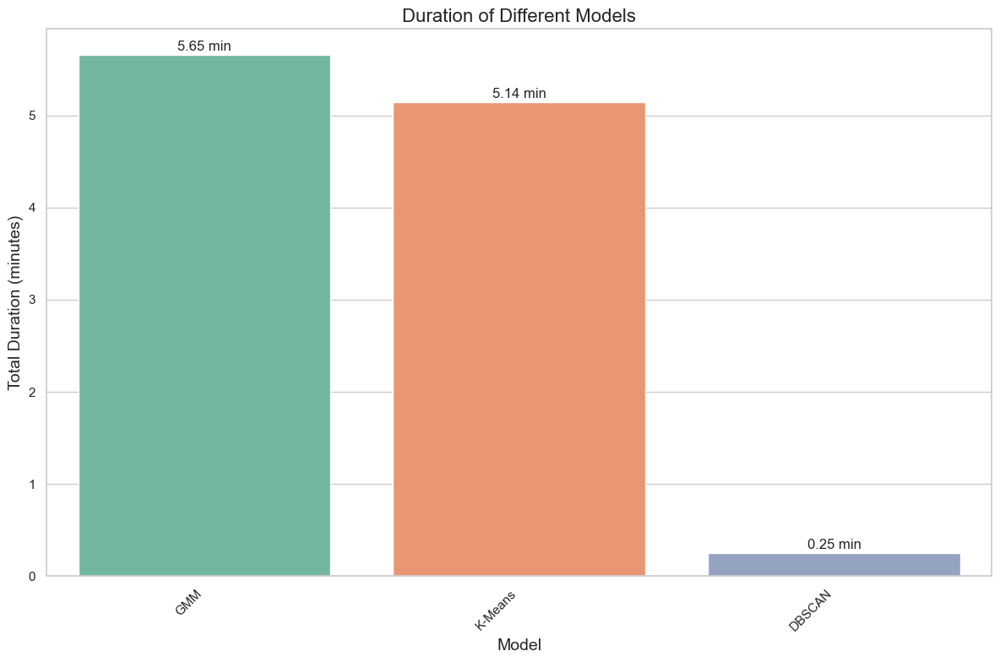

In [70]:
# Convert all durations to total minutes for each step
def to_minutes(td):
    return td.total_seconds() / 60

gmm_time = to_minutes(duration_down + duration6 + duration8 + duration9 + duration10)

kmeans_time = to_minutes(duration12 + duration13 + duration14 + duration15 + duration16)

dbscan_time = to_minutes(duration17 + duration18 + duration19 + duration20)

# Create labels and the corresponding durations for each model
labels = ['GMM', 'K-Means', 'DBSCAN']

durations = [gmm_time, kmeans_time, dbscan_time]

# Set Seaborn style and a larger color palette
sns.set(style="whitegrid")
colors = sns.color_palette("Set2", n_colors=9)

# Plotting the bar plot using Seaborn
fig, ax = plt.subplots(figsize=(12, 8))
sns.barplot(x=labels, y=durations, ax=ax, palette=colors)

# Adding titles and labels
ax.set_title('Duration of Different Models', fontsize=16)
ax.set_ylabel('Total Duration (minutes)', fontsize=14)
ax.set_xlabel('Model', fontsize=14)

# Adding value annotations on top of bars
for i, duration in enumerate(durations):
    ax.text(i, duration + 0.05, f'{duration:.2f} min', ha='center', fontsize=12)

# Rotate x-axis labels for readability
plt.xticks(rotation=45, ha='right')

# Show the plot
plt.tight_layout()
plt.show()

# References

1. Beckman Coulter. (2022). Automatic gating - Beckman Coulter. Flow Cytometry. https://www.beckman.com/flow-cytometry/software/cytobank-premium/learning-center/automatic-gating
2. Brestoff, J. R., & Frater, J. L. (2022). Contemporary challenges in clinical flow cytometry: Small samples, big data, little time. Journal of Applied Laboratory Medicine, 7(22), 931-944. https://doi.org/10.1093/jalm/jfab176
3. Cossarizza, A., Chang, H. D., Radbruch, A., Acs, A., Adam, D., Adam-Klages, S., Agace, W. W., Aghaeepour, N., Akdis, M., Allez, M., Almeida, L. N., Alvisi, G., Anderson, G., Andrä, I., Annunziato, F., Anselmo, A., Bacher, P., Baldari, C. T., Bari, S., Barnaba, V., … Zychlinsky, A. (2019). Guidelines for the use of flow cytometry and cell sorting in immunological studies (second edition). European journal of immunology, 49(10), 1457–1973. https://doi.org/10.1002/eji.201970107
4. FlowRepository. (2020). FlowRepository ID FR-FCM-Z32U. Retrieved from http://flowrepository.org/experiments/3166/download_ziped_files
5. Hennig, H., Rees, P., Blasi, T., Kamentsky, L., Hung, J., Dao, D., Carpenter, A. E., & Filby, A. (2016). An open-source solution for advanced imaging flow cytometry data analysis using machine learning. Methods, 112(2017), 201–210. http://dx.doi.org/10.1016/j.ymeth.2016.08.018
6. Hu, Z., Bhattacharya, S., & Butte, A. J. (2022). Application of machine learning for cytometry data. Frontiers in immunology, 12, 787574. https://doi.org/10.3389/fimmu.2021.787574
7. Lee, J. A., Spidlen, J., Boyce, K., Cai, J., Crosbie, N., Dalphin, M., Furlong, J., Gasparetto, M., Goldberg, M., Goralczyk, E. M., Hyun, B., Jansen, K., Kollmann, T., Kong, M., Leif, R., McWeeney, S., Moloshok, T. D., Moore, W., Nolan, G., Nolan, J., … Brinkman, R. R. (2008). MIFlowCyt: the minimum information about a Flow Cytometry Experiment. Cytometry. Part A: the journal of the International Society for Analytical Cytology, 73(10), 926–930. https://doi.org/10.1002/cyto.a.20623
8. Maecker, H. T., McCoy, J. P., & Nussenblatt, R. (2012). Standardizing immunophenotyping for the Human Immunology Project. Nature Reviews Immunology, 12(3), 191–200. https://doi.org/10.1038/nri3158
Mair, F., & Leichti, T. (2020). Comprehensive Phenotyping of Human Dendritic Cells and Monocytes. Journal of Quantitative Cell Science, 99(3), 231–242. https://doi.org/10.1002/cyto.a.24269
9. Monaco, G., Chen, H., Poidinger, M., Chen, J., Magalhaes, J., & Larbi, A. (2016). FlowAI: Automatic and interactive anomaly discerning tools for flow cytometry data. Bioinformatics, 32(16), 2473–2480. https://doi.org/10.1093/bioinformatics/btw191
10. Ng, D. P., Simonson, P. D., Tarnok, A., Lucas, F., Kern, W., Rolf, N., Bogdanoski, G., Green, C., Brinkman, R. R., & Czechowska, K. (2024). Recommendations for using artificial intelligence in clinical flow cytometry. Cytometry part b: Clinical cytometry, 106(4), 228–238. https://doi.org/10.1002/cyto.b.22166
11. Policar, P. (2023). How t-SNE works. Read the Docs. https://opentsne.readthedocs.io
/en/latest/tsne_algorithm.html
12. Spidlen J, Breuer K, Rosenberg C, Kotecha N and Brinkman RR. (2012). FlowRepository - A Resource of Annotated Flow Cytometry Datasets Associated with Peer-reviewed Publications. Cytometry A. 81(9), 727-31. https://doi.org/10.1002/cyto.a.22106
